In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import re
import utils
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

import logging
from prophet import Prophet
from datetime import datetime, time, timedelta
from multiprocessing import cpu_count, Pool
import pycountry

## Upload all Data

In [2]:
dataT = pd.read_csv(r'/Users/edgartome_1/IronHack/IronProjects/Final_project/Original_Data_Code/extract.csv')
dataT.head()

,city,type,provider,ts,nb_trip,rain,snow,main,time_lost,before_lag,nb_vehic_avail
0,aarhus,CAR,32,2021-05-11T10:00:00Z,7,NaN,NaN,NaN,0.0,0,88.0
1,aarhus,CAR,32,2021-05-11T11:00:00Z,15,NaN,NaN,NaN,0.0,0,88.0
2,aarhus,CAR,32,2021-05-11T12:00:00Z,25,NaN,NaN,NaN,0.0,0,88.0
3,aarhus,CAR,32,2021-05-11T13:00:00Z,16,NaN,NaN,NaN,0.0,0,88.0
4,aarhus,CAR,32,2021-05-11T14:00:00Z,16,NaN,NaN,NaN,0.0,0,88.0


In [3]:
dataT.columns

Index(['city', 'type', 'provider', 'ts', 'nb_trip', 'rain', 'snow', 'main',
       'time_lost', 'before_lag', 'nb_vehic_avail'],
      dtype='object')

In [4]:
#How many citys

print('Name of the citys', dataT.city.unique())
print('Number of citys', dataT.city.nunique())

Name of the citys ['aarhus' 'amsterdam' 'antwerp' 'barcelona' 'bari' 'berlin' 'bilbao'
 'bonn' 'bordeaux' 'bratislava' 'bremen' 'bristol' 'bruxelles' 'budapest'
 'delft' 'dortmund' 'dublin' 'dusseldorf' 'eindhoven' 'enschede' 'essen'
 'frankfurt' 'gdansk' 'geneva' 'gothenburg' 'haarlem' 'hamburg' 'hanover'
 'heilbronn' 'helsingborg' 'helsinki' 'istanbul' 'karlsruhe' 'koln'
 'leipzig' 'lisbon' 'ljubljana' 'london' 'lubeck' 'lund' 'lyon' 'madrid'
 'malmo' 'milano' 'modena' 'munchen' 'munster' 'nice' 'norrkoping'
 'nuremberg' 'odense' 'orebro' 'oslo' 'paris' 'pisa' 'potsdam' 'prague'
 'reggio_emilia' 'riga' 'rome' 'rotterdam' 'seville' 'stockholm' 'tallinn'
 'the_hague' 'tilburg' 'torino' 'trondheim' 'vilnius' 'warsaw'
 'washington' 'wien' 'winterthur' 'zurich' 'zwolle']
Number of citys 75


In [5]:
#How many types sharing

print('Name of types sharing', dataT.type.unique())
print('Number of types sharing', dataT.type.nunique())

Name of types sharing ['CAR' 'BIKE' 'MOTORSCOOTER' 'SCOOTER']
Number of types sharing 4


In [6]:
#How many types of providers

print('Name of the provider', dataT.provider.unique())
print('Number of provider', dataT.provider.nunique())

Name of the provider [32  7 41 42 21 35 47 51  6 44 23 22 53 30 26 25 37 10 46 20 34 39 45 19
 14  5  8  9 24 36 27 16 31 13  3 12 15 17 38  4 40 49 18  1 52 11  2 28
 48 29 43 50 33]
Number of provider 53


In [7]:
#Transform time that was in object to date time type
dataT['ts'] = pd.to_datetime(dataT['ts'], format='%Y/%m/%d %H:%M:%S')

In [8]:
#Fuction to remove time zone

def time_n_zone(data):
    data['ts'] = data['ts'].astype(str)
    ogdata = list(data['ts'])
    newtime = []
    for time in ogdata:
        time = time[:-6]
        newtime.append(time)
    data['ts'] = newtime
    data['ts'] = data['ts'].apply(pd.to_datetime)

In [9]:
#Select data by city, type and provider. Change column names of ds to ts and nb_vehic_avail to y

def subsetDataFrame(city, type_s, provider_num):
    DataFrame = dataT[(dataT['city'] == city) & (dataT['type'] == type_s) & (dataT['provider'] == provider_num)]
    #del DataFrame['Unnamed: 0']
    time_n_zone(DataFrame)
    DataFrame.rename(columns = {'ts':'ds', 'nb_trip':'y'}, inplace = True)
    DataFrame = DataFrame.drop(['city', 'type', 'provider'], axis=1)
    le = LabelEncoder()
    DataFrame['main'] = le.fit_transform(DataFrame.main.values)
    return DataFrame

### Define new data for city, type of sharing and provider

In [10]:
data = subsetDataFrame('aarhus', 'CAR', 32)
data

,ds,y,rain,snow,main,time_lost,before_lag,nb_vehic_avail
0,2021-05-11 10:00:00,7,NaN,NaN,4,0.0,0,88.0
1,2021-05-11 11:00:00,15,NaN,NaN,4,0.0,0,88.0
2,2021-05-11 12:00:00,25,NaN,NaN,4,0.0,0,88.0
3,2021-05-11 13:00:00,16,NaN,NaN,4,0.0,0,88.0
4,2021-05-11 14:00:00,16,NaN,NaN,4,0.0,0,88.0
...,...,...,...,...,...,...,...,...
10022,2022-07-03 00:00:00,0,0.0,0.0,1,0.0,0,NaN
10023,2022-07-03 01:00:00,0,0.0,0.0,1,0.0,0,NaN
10024,2022-07-03 02:00:00,0,0.0,0.0,1,0.0,0,NaN
10025,2022-07-03 03:00:00,0,0.0,0.0,1,0.0,0,NaN


### EDA of Data

In [11]:
# Any missing data to remove, our fill
data.isnull().sum()

ds                  0
y                   0
rain              722
snow              722
main                0
time_lost           0
before_lag          0
nb_vehic_avail    149
dtype: int64

In [12]:
#Fill missing values with near values
for col in ['rain','snow','main','nb_vehic_avail']:
        data[col] = data[col].ffill()
        data[col] = data[col].bfill()

In [13]:
#Check
data.isnull().sum()

ds                0
y                 0
rain              0
snow              0
main              0
time_lost         0
before_lag        0
nb_vehic_avail    0
dtype: int64

In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10027 entries, 0 to 10026
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   ds              10027 non-null  datetime64[ns]
 1   y               10027 non-null  int64         
 2   rain            10027 non-null  float64       
 3   snow            10027 non-null  float64       
 4   main            10027 non-null  int64         
 5   time_lost       10027 non-null  float64       
 6   before_lag      10027 non-null  int64         
 7   nb_vehic_avail  10027 non-null  float64       
dtypes: datetime64[ns](1), float64(4), int64(3)
memory usage: 705.0 KB


In [15]:
data.head()

,ds,y,rain,snow,main,time_lost,before_lag,nb_vehic_avail
0,2021-05-11 10:00:00,7,0.0,0.0,4,0.0,0,88.0
1,2021-05-11 11:00:00,15,0.0,0.0,4,0.0,0,88.0
2,2021-05-11 12:00:00,25,0.0,0.0,4,0.0,0,88.0
3,2021-05-11 13:00:00,16,0.0,0.0,4,0.0,0,88.0
4,2021-05-11 14:00:00,16,0.0,0.0,4,0.0,0,88.0


In [16]:
#What does each column mean?
data.describe().T

,count,mean,std,min,25%,50%,75%,max
y,10027.0,10.757156,7.371830,0.0,4.0,10.0,16.0,54.00
rain,10027.0,0.082455,0.560987,0.0,0.0,0.0,0.0,27.34
snow,10027.0,0.008117,0.094282,0.0,0.0,0.0,0.0,3.65
main,10027.0,1.153286,0.940341,0.0,1.0,1.0,1.0,4.00
time_lost,10027.0,0.017380,0.128284,0.0,0.0,0.0,0.0,1.00
before_lag,10027.0,0.005585,0.266803,0.0,0.0,0.0,0.0,24.00
nb_vehic_avail,10027.0,98.140321,18.000952,52.0,85.0,89.0,118.0,130.00


In [17]:
#Quantitie of outliers
numcol = list(data.describe().columns)

for x in numcol:
    Q3 = data[x].quantile(0.75)
    Q1= data[x].quantile(0.25)
    IQR = Q3 - Q1
    filters = data[data[x]>Q3 + 1.5*IQR]
    print('Column', x)
    print('Number of outliers', len(filters))
    print('Percentage of outliers', "{:.1f}".format((len(filters)/len(data[x]))*100))
    print('\n')

Column y
Number of outliers 19
Percentage of outliers 0.2


Column rain
Number of outliers 1064
Percentage of outliers 10.6


Column snow
Number of outliers 157
Percentage of outliers 1.6


Column main
Number of outliers 1451
Percentage of outliers 14.5


Column time_lost
Number of outliers 199
Percentage of outliers 2.0


Column before_lag
Number of outliers 14
Percentage of outliers 0.1


Column nb_vehic_avail
Number of outliers 0
Percentage of outliers 0.0




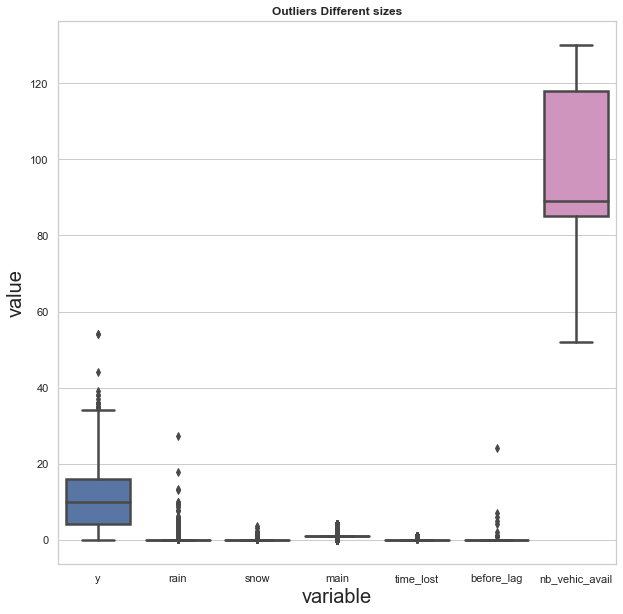

In [18]:
fig = plt.figure(figsize=(10,10))

sns.set_theme(style="whitegrid")

plt.title('Outliers Different sizes', fontweight='bold')

plt.xlabel("variable", fontsize = 20)
plt.ylabel("value", fontsize = 20)

sns.boxplot(data=data, linewidth=2.5)

plt.show()

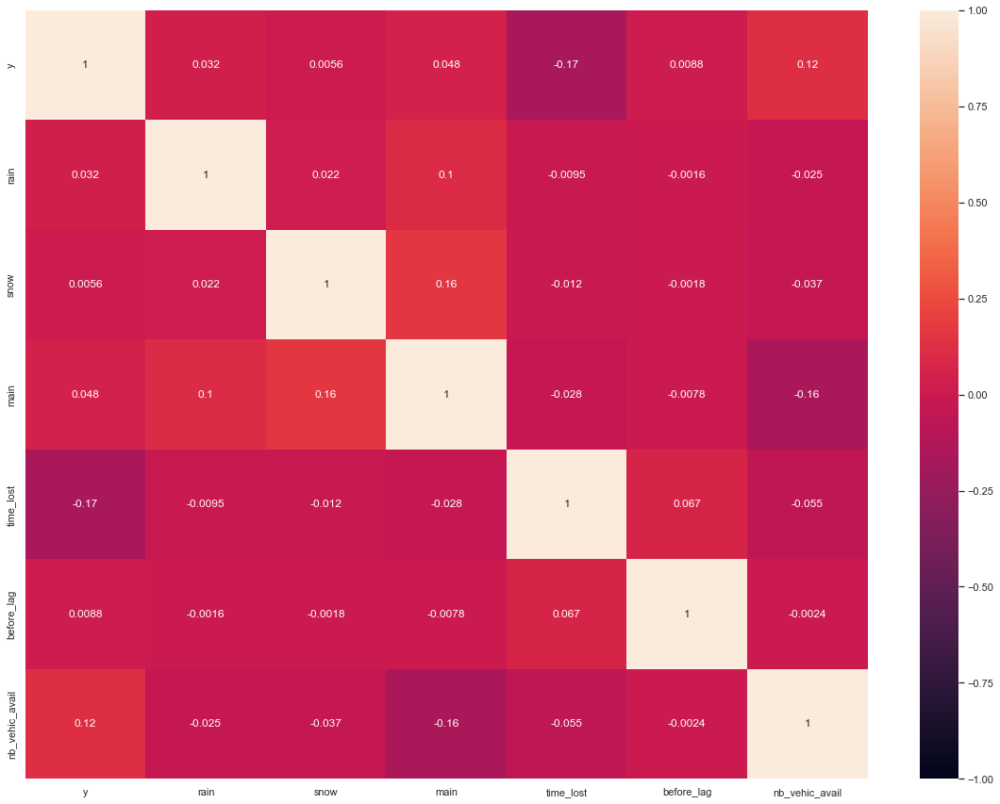

In [19]:
# Column collinearity - any high correlations?

plt.figure(figsize=(20, 15))

heatmap = sns.heatmap(data.corr(), vmin=-1, vmax=1, annot=True)

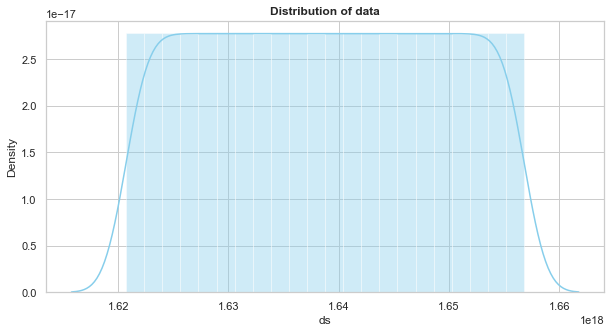

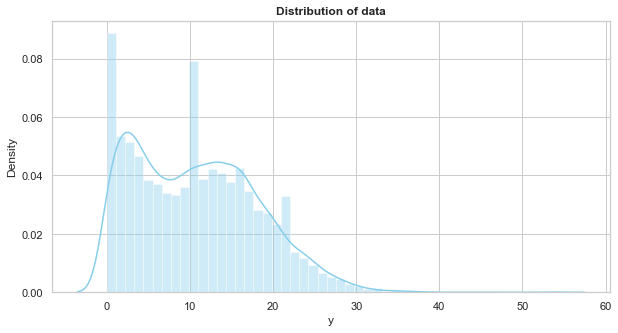

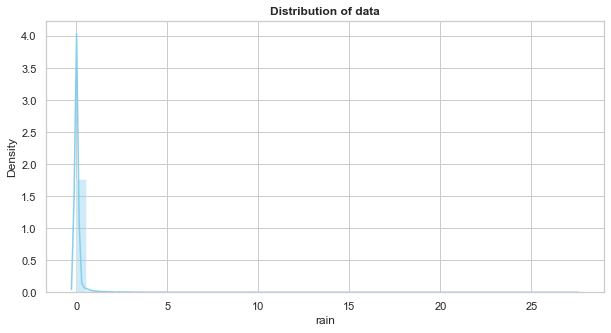

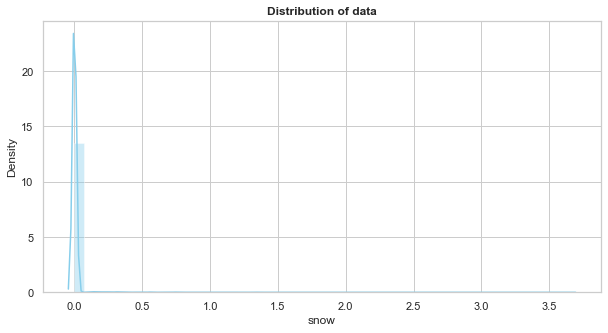

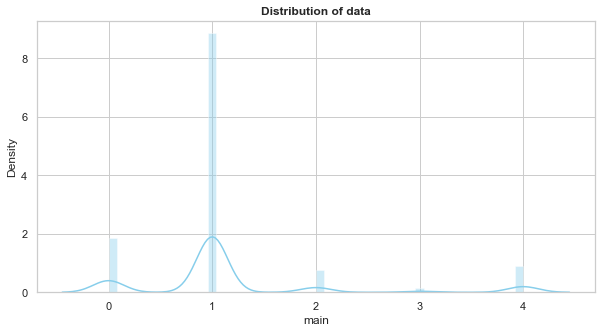

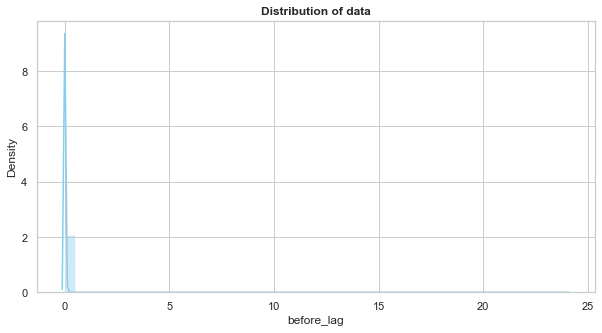

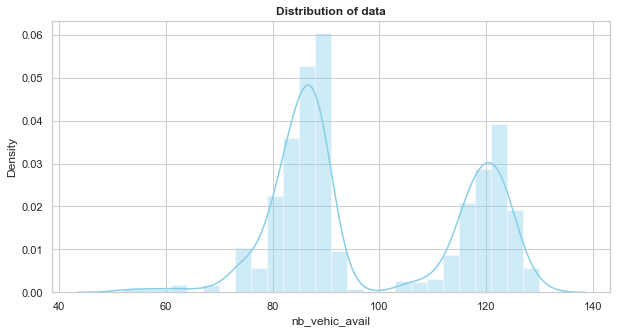

In [20]:
#Plot distribution of data of columns with numerical values
colum = ['ds','y', 'rain', 'snow', 'main', 'before_lag', 'nb_vehic_avail']
#colum = ['y', 'rain', 'snow', 'main', 'before_lag', 'nb_vehic_avail']
for col in colum:
    f, axes = plt.subplots(figsize=(10, 5), sharex=True)
    plt.title('Distribution of data', fontweight='bold')
    sns.distplot(data[col],hist=True, color="skyblue")
    plt.xlabel(col)
    plt.show()

In [21]:
data.to_csv(r'/Users/edgartome_1/IronHack/IronProjects/Final_project/Data clean/clean_data_denmark_aarhus_cars.csv')

## Apply model Prophet

In [22]:
x = len(data) - len(data)*0.8
x

2005.3999999999996

In [23]:
#Train data set
data_train = data[:-2005]
data_train


,ds,y,rain,snow,main,time_lost,before_lag,nb_vehic_avail
0,2021-05-11 10:00:00,7,0.0,0.0,4,0.0,0,88.0
1,2021-05-11 11:00:00,15,0.0,0.0,4,0.0,0,88.0
2,2021-05-11 12:00:00,25,0.0,0.0,4,0.0,0,88.0
3,2021-05-11 13:00:00,16,0.0,0.0,4,0.0,0,88.0
4,2021-05-11 14:00:00,16,0.0,0.0,4,0.0,0,88.0
...,...,...,...,...,...,...,...,...
8017,2022-04-10 11:00:00,15,0.0,0.0,0,0.0,0,118.0
8018,2022-04-10 12:00:00,13,0.0,0.0,0,0.0,0,118.0
8019,2022-04-10 13:00:00,20,0.0,0.0,0,0.0,0,118.0
8020,2022-04-10 14:00:00,18,0.0,0.0,0,0.0,0,118.0


In [24]:
#Test data set
data_test = data[-2005:]
data_test

,ds,y,rain,snow,main,time_lost,before_lag,nb_vehic_avail
8022,2022-04-10 16:00:00,25,0.0,0.0,1,0.0,0,118.0
8023,2022-04-10 17:00:00,13,0.0,0.0,1,0.0,0,118.0
8024,2022-04-10 18:00:00,9,0.0,0.0,1,0.0,0,118.0
8025,2022-04-10 19:00:00,23,0.0,0.0,1,0.0,0,118.0
8026,2022-04-10 20:00:00,13,0.0,0.0,1,0.0,0,118.0
...,...,...,...,...,...,...,...,...
10022,2022-07-03 00:00:00,0,0.0,0.0,1,0.0,0,105.0
10023,2022-07-03 01:00:00,0,0.0,0.0,1,0.0,0,105.0
10024,2022-07-03 02:00:00,0,0.0,0.0,1,0.0,0,105.0
10025,2022-07-03 03:00:00,0,0.0,0.0,1,0.0,0,105.0


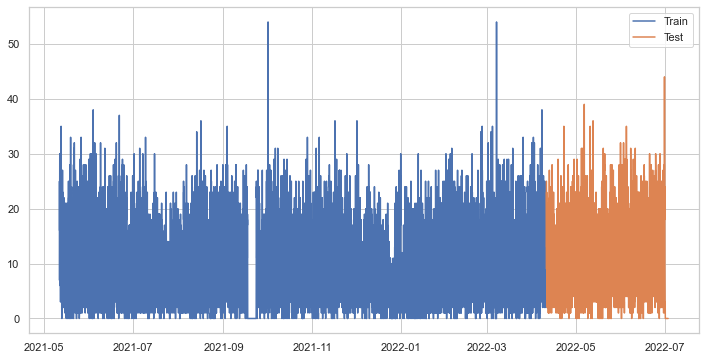

In [25]:
from matplotlib.pylab import rcParams

rcParams['figure.figsize']=12,6

#plotting the data
plt.plot(data_train['ds'],data_train['y'], label='Train')
plt.plot(data_test['ds'],data_test['y'], label='Test')
plt.legend()

In [26]:
# Apply model Prophet

def fit_model(DATA, COUNTRY):
    m = Prophet(seasonality_mode='multiplicative', yearly_seasonality = True, changepoint_range=0.95)

    # GET COUNTRY CODE AND ADD PROPHET HOLIDAYS

    #COUNTRY = 'DENMARK'
    country_info = pycountry.countries.get(name=COUNTRY.replace("_"," ")) or pycountry.countries.get(official_name=COUNTRY.replace("_"," ")) or pycountry.countries.get(alpha_3=COUNTRY)
    m.add_country_holidays(country_name=country_info.alpha_2)

    # ADD REGRESSORS

    for reg in [e for e in list(DATA.columns) if e not in ('ds','y')]:
        m.add_regressor(reg)


    m.fit(DATA)
    return m

In [27]:
m = fit_model(data_train, 'DENMARK')

Initial log joint probability = -83.0395
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       16551.2    0.00760667       344.926           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       16560.6    0.00056985        119.56           1           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       16563.3    0.00399766       200.008       4.288      0.6933      365   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     375       16563.8   4.38027e-05       104.664   2.514e-07       0.001      504  LS failed, Hessian reset 
     399       16563.9   3.67688e-06       70.8638      0.3754           1      537   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     443       16563.9   3.20871e-05    

In [28]:
future = m.make_future_dataframe(periods=len(data_test), freq='H', include_history=False)
future.tail()

,ds
2000,2022-07-03 00:00:00
2001,2022-07-03 01:00:00
2002,2022-07-03 02:00:00
2003,2022-07-03 03:00:00
2004,2022-07-03 04:00:00


In [29]:
#To use forecast = m.predict(future), have to add future values of (rain,snow,main,time_lost,before_lag,nb_vehic_avail)
#Our use the model wihtout the regressoers for (rain,snow,main,time_lost,before_lag,nb_vehic_avail)

forecast = m.predict(data_test)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
2000,2022-07-03 00:00:00,5.878469,0.554728,11.397450
2001,2022-07-03 01:00:00,4.767924,-0.357054,10.209747
2002,2022-07-03 02:00:00,3.808337,-1.480459,9.445371
2003,2022-07-03 03:00:00,3.014040,-2.454979,8.081795
2004,2022-07-03 04:00:00,3.149933,-1.885129,8.887251


In [30]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Anden juledag,Anden juledag_lower,Anden juledag_upper,Anden pinsedag,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
0,2022-04-10 16:00:00,11.983589,15.605863,25.289889,11.983589,11.983589,0.0,0.0,0.0,0.0,...,-0.120127,-0.120127,-0.120127,0.049047,0.049047,0.049047,0.0,0.0,0.0,20.587117
1,2022-04-10 17:00:00,11.984445,13.412086,24.270030,11.984445,11.984445,0.0,0.0,0.0,0.0,...,-0.117929,-0.117929,-0.117929,0.049991,0.049991,0.049991,0.0,0.0,0.0,18.780534
2,2022-04-10 18:00:00,11.985302,11.424130,22.206137,11.985302,11.985302,0.0,0.0,0.0,0.0,...,-0.115444,-0.115444,-0.115444,0.050935,0.050935,0.050935,0.0,0.0,0.0,16.790579
3,2022-04-10 19:00:00,11.986158,9.831479,20.413666,11.986158,11.986158,0.0,0.0,0.0,0.0,...,-0.112712,-0.112712,-0.112712,0.051877,0.051877,0.051877,0.0,0.0,0.0,14.918345
4,2022-04-10 20:00:00,11.987015,7.529996,18.310748,11.987015,11.987015,0.0,0.0,0.0,0.0,...,-0.109775,-0.109775,-0.109775,0.052817,0.052817,0.052817,0.0,0.0,0.0,12.882851
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2000,2022-07-03 00:00:00,13.696315,0.554728,11.397450,12.929873,14.460754,0.0,0.0,0.0,0.0,...,-0.091857,-0.091857,-0.091857,0.034441,0.034441,0.034441,0.0,0.0,0.0,5.878469
2001,2022-07-03 01:00:00,13.697172,-0.357054,10.209747,12.930722,14.461961,0.0,0.0,0.0,0.0,...,-0.097701,-0.097701,-0.097701,0.034434,0.034434,0.034434,0.0,0.0,0.0,4.767924
2002,2022-07-03 02:00:00,13.698028,-1.480459,9.445371,12.931571,14.463450,0.0,0.0,0.0,0.0,...,-0.103013,-0.103013,-0.103013,0.034427,0.034427,0.034427,0.0,0.0,0.0,3.808337
2003,2022-07-03 03:00:00,13.698884,-2.454979,8.081795,12.932419,14.464939,0.0,0.0,0.0,0.0,...,-0.107773,-0.107773,-0.107773,0.034419,0.034419,0.034419,0.0,0.0,0.0,3.014040


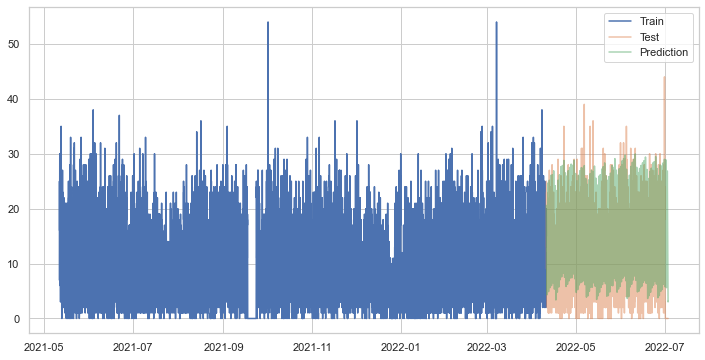

In [31]:
#Plot the train and test data on top the forecast
plt.plot(data_train.set_index('ds')['y'], label='Train')
plt.plot(data_test.set_index('ds')['y'], label='Test',alpha=0.5)
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',alpha=0.5)
plt.legend()

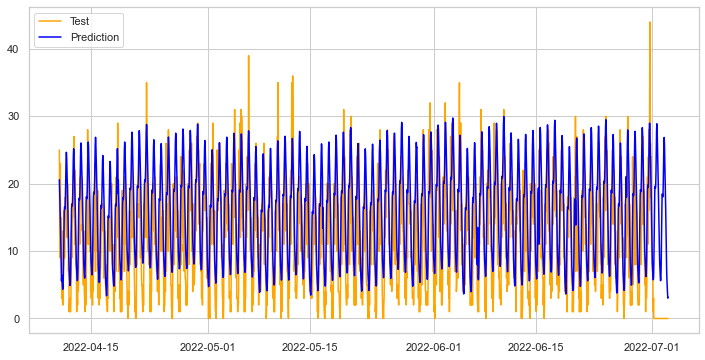

In [32]:
#Plot data test and prediction
fig, ax = plt.subplots()
plt.plot(data_test.set_index('ds')['y'], label='Test',color='orange')
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',color='blue')
plt.legend()

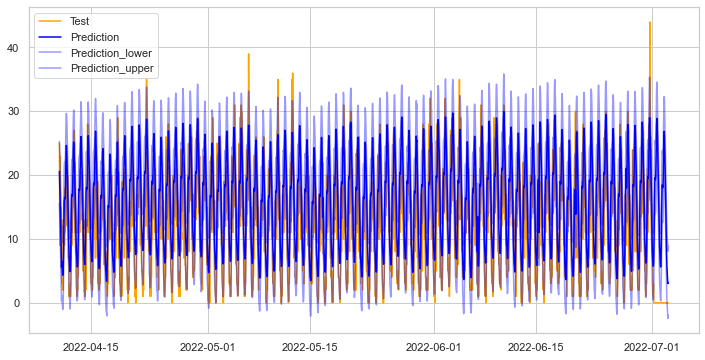

In [33]:
#Plot data test and prediction
fig, ax = plt.subplots()
plt.plot(data_test.set_index('ds')['y'], label='Test',color='orange')
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',color='blue')
lower=plt.plot(forecast.set_index('ds')['yhat_lower'], label='Prediction_lower',alpha=0.4,color='blue')
upper=plt.plot(forecast.set_index('ds')['yhat_upper'], label='Prediction_upper',alpha=0.4,color='blue')
plt.legend()

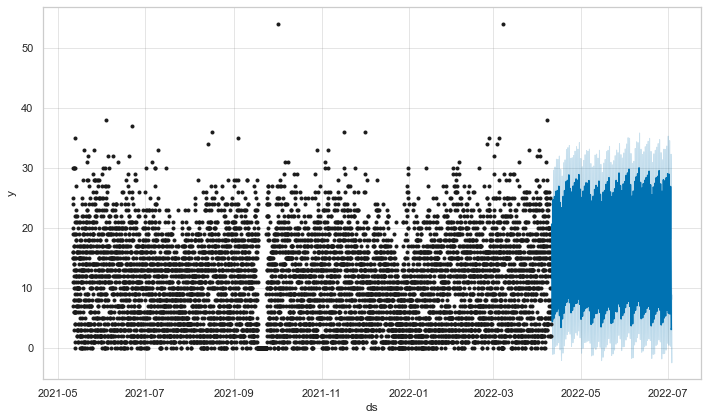

In [34]:
fig1 = m.plot(forecast)

In [35]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m, forecast)

In [36]:
plot_components_plotly(m, forecast)

## Test model - Cross validation

In [37]:
len(data_test['y'])


2005

In [38]:
len(forecast['yhat'])

2005

In [39]:
#calculate Root Mean Square  Error(RMSE)
from math import sqrt
from sklearn.metrics import mean_squared_error

rms = sqrt(mean_squared_error(data_test['y'],forecast['yhat']))

print('The root mean square error score for the model is: ', rms)

The root mean square error score for the model is:  6.537177827872834


In [40]:
#calculate Mean Absolute Error(MAE)
from math import sqrt
from sklearn.metrics import mean_squared_error

mae = mean_squared_error(data_test['y'],forecast['yhat'])

print('The mean absolute error score for the model is: ', mae)

The mean absolute error score for the model is:  42.73469395323218


In [41]:
#Coefficient of Determination or R^2
from sklearn.metrics import r2_score

r2 = r2_score(data_test['y'],forecast['yhat'])

print('The coefficient of determination of r2 score for the model is: ', r2)

The coefficient of determination of r2 score for the model is:  0.25072656075897004


In [42]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error

y_true = data_test['y'].values
y_pred = forecast['yhat'].values

mae_01 = mean_absolute_error(y_true, y_pred)
mape_01 = mean_absolute_percentage_error(y_true, y_pred)

print('The mean absolute error for the model is: ', mae_01)
print('\n')
print('The mean absolute percentage error for the model is: ', mape_01)

The mean absolute error for the model is:  5.235372935955585


The mean absolute percentage error for the model is:  2167851132943539.8


In [43]:
days_train = data['ds'].iloc[8021] - data['ds'].iloc[0]
days_train

Timedelta('334 days 05:00:00')

In [44]:
days_test = data['ds'].iloc[10026] - data['ds'].iloc[8022]
days_test

Timedelta('83 days 12:00:00')

In [45]:
total_days = days_train + days_test
total_days

Timedelta('417 days 17:00:00')

In [46]:
import warnings
warnings.filterwarnings("ignore")

In [47]:
# Cross validation
#Train on the first 200 days, aply to next 5 days and loop each 5 days to reach final data
from prophet.diagnostics import cross_validation

df_cv = cross_validation(m, initial='200 days', period='5 days', horizon = '20 days', parallel="processes")

INFO:prophet:Making 23 forecasts with cutoffs between 2021-12-01 15:00:00 and 2022-03-21 15:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80698d60a0>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -57.3274
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -155.652
Initial log joint probability = -90.2288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -211.829
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -57.4292
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0455
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -62.2277
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -59.2312
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       10639.5    0.00177307       136.995           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       10117.9    0.00343605       247.059      0.6312      0.6312      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       10900.2    0.00767097       131.873           1           1      121   
    Iter      log prob 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       10646.1   0.000190192       66.6953           1           1      653   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       11455.2    0.00050473       83.0827           1           1      611   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     444       11695.8   2.75101e-05       80.0834   3.175e-07       0.001      637  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       11177.1   4.50154e-05       80.4452      0.3291      0.9761      657   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       10909.2   0.000200902       116.382      0.9471      0.9471      705   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       10126.6   0.000152474       81.7038           1           1      758   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       10377.6   0.000903487       77.1367           1           1      698   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     519       11177.1   7.19674e-07       76.7317      0.3441           1      683   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     407       11455.3   0.000793795        93.302   1.176e-05       0.001      670  LS fai

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       11695.9   0.000207654       101.615           1           1      706   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       10646.2   2.21351e-06        71.407      0.2745           1      778   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       10378.3   0.000222034       135.262      0.7835      0.7835      814   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       10909.3   4.96004e-05        83.008           1           1      822   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     520       11695.9   2.01246e-05       90.4966   2.564e-07       0.001      769  LS failed, Hessian reset 
     648       10126.7   3.72385e-05       73.2157   5.051e-07       0.001      881  LS failed, Hessian reset 
     499       11455.9   9.27254e-05       77.0808        2.41       0.241      777   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     541       11695.9   3.14126e-07        83.873      0.2451           1      798   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     699       10126.8   0.000103577       88.6395      0.7362      0.7362      939   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       10646.5    0.00116175       89.6159           1           1      892   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       10909.4     0.0001183       82.5727      0.7941      0.7941      937   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     799       10378.6   6.33086e-05       88.1296           1           1      930   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     779       10126.8   2.98003e-07       83.4512       0.382           1     1033   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     599       11456.1   9.37822e-05       62.0865      0.2219           1      902   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799         10648    0.00178529       87.5639        0.74        0.74     1008   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     899       10380.7    0.00333846       652.127      0.1743      0.1743     1039   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       10909.5   0.000200675       97.2561           1           1     1057   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     825       10909.5   1.32822e-06       79.8725      0.1884           1     1088   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     899       10650.6    0.00203793       111.725           1           1     1122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     673       11456.8   8.36465e-05       173.716   2.917e-07       0.001     1037  LS failed, Hessian reset 
     999       10386.2    0.00522601       139.655           1           1     1150   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       11457.5    0.00059961       130.505           1           1     1069   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1009       10386.5   3.79154e-05       146.765   1.864e-07       0.001     1204  LS failed, Hessian reset 
     727       11457.5   4.94858e-05       105.577   5.035e-07       0.001     1142  LS failed, Hessian reset 
     999         10652   8.88387e-05       139.749      0.2293      0.9927     1248   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1199       10654.6    0.00364973       255.187           1           1     1487   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       10387.9   0.000104689       71.0544      0.3629      0.3629     1552   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       10656.8    0.00755815       399.769           1           1     1604   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       10389.9     0.0100984       908.376           1           1     1669   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       10659.2   0.000123778       100.967           1           1     1734   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       10391.5    0.00118044        513.68       9.642      0.9642     1802   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1999         10395    0.00437357       132.104           1           1     2420   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1836       10662.1   1.18403e-05       67.2927   1.004e-07       0.001     2403  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       12201.2    0.00291294       502.507           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -70.9513
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1895       10662.2   1.67749e-06       54.7177      0.4811      0.4811     2490   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    2099       10395.5   8.30671e-05       168.649      0.5206      0.5206     2554   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -65.689
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       12207.3    0.00115305       144.159      0.7289      0.7289      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       12462.7    0.00676891       184.035           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2199       10396.1    0.00105371       135.057       0.912       0.912     2671   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -120.061
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       12720.1    0.00373549       418.714      0.5445      0.5445      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2299       10396.3   4.59442e-05       88.1746      0.2964           1     2795   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       12208.8   0.000446923       91.9287           1           1      368   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       12469.2    0.00209883       341.234      0.6011      0.6011      252   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -84.5635
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       12983.1     0.0106494       572.698           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2399       10396.5   0.000237855       134.142      0.7378      0.7378     2926   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       12728.4    0.00108481       99.4914      0.1268           1      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       12209.5   0.000188089       109.932           1           1      483   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    2424       10396.5   3.46761e-07       44.7753     0.06518           1     2961   
Optimization terminated normally: 
  Convergence detected: relat

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       13232.3     0.0105971         229.8           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       12995.6    0.00696073       158.709      0.4353           1      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       12209.8    0.00711268       103.755           1           1      596   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       12731.4    0.00108163       178.864           1           1      374   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -179.005
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       12472.4   0.000208891       99.5186      0.6661      0.6661      515   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       13242.4   0.000275366       249.776      0.5687      0.5687      233   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       12214.2    0.00116186       121.908      0.6009      0.6009      710   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       12997.7   0.000605852       178.363           1           1      377   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       12732.4     0.0021336       369.808           1           1      493   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     299       13471.5    0.00118565       212.211           1           1      363   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     487       13247.7   6.78989e-07       64.7779           1           1      604   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     799       12477.3   0.000528258       139.552      0.6983      0.6983      972   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     540         13000   0.000116953       111.691   1.322e-06       0.001      773  LS failed, Hessian reset 
     660       12733.5   4.29927e-06       62.2805   7.135e-08       0.001      877  LS failed, Hessian reset 
     673       12733.5   1.05609e-06       87.4587           1           1      892   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     576         13000   6.46131e-07       67.0233      0.3161           1      824   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399         13474    0.00023009       105.847      0.8631      0.8631      491   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899         12483    0.00781796       200.212       2.124      0.2124     1088   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     499       13474.9   5.55781e-05       86.8852           1           1      613   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       12484.2    0.00336278       69.7616           1           1     1202   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     552       13475.2   5.99847e-05       112.851   4.393e-07       0.001      706  LS failed, Hessian reset 
    1099       12485.8   0.000295982       125.959      0.1882           1     1321   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       13475.4   5.89907e-05       95.0521           1           1      760   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -65.4556
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1199         12486    3.9277e-05       72.9568      0.3914      0.3914     1453   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       13475.6    0.00262501       112.468           1           1      871   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     723       13476.4   7.32211e-05       130.718   3.887e-07       0.001      943  LS failed, Hessian reset 
      99       13680.9   0.000564094       543.197     0.05526           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1241         12486   2.15361e-05       70.5794   3.253e-07       0.001     1553  LS failed, Hessian reset 
    1299       12486.1   0.000375869       70.7784           1           1     1618   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       13476.7   6.97196e-05       75.6392       0.748

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       13691.4   0.000145794       73.8836           1           1      386   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       12488.3   0.000504859       154.911           1           1     1860   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       13477.8    0.00486188       325.187      0.2358      0.2358     1248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       13938.5    0.00591985        150.51           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       13692.9    0.00235966       118.626      0.5735           1      500   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       12488.6   0.000267576       97.6922           1           1     1976   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -71.988
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     598       13698.1   6.45457e-05       96.9761   1.834e-07       0.001      818  LS failed, Hessian reset 
     599       13698.1   0.000172577       88.5767          10           1      820   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -268.216
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1899       12499.8    0.00168288        699.28       1.425      0.1425     2383   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       13953.7    0.00928643       211.954       0.264           1      505   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1359       13481.6   2.30307e-05       96.5464   2.855e-07       0.001     1710  LS

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1399       13481.7   6.69338e-06       69.1782      0.2124      0.2124     1752   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     413         13954   5.66823e-05       120.516   2.448e-07       0.001      562  LS failed, Hessian reset 
Initial log joint probability = -97.611
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -72.8006
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1416       13481.7   1.55428e-06       67.8656      0.3098           1     1775   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     699         13699   3.73517e-06       80.5447      0.4243      0.4243      947   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       14194.4     0.0238844       229.348           1           

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99       14448.9     0.0136981       659.013           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1999       12501.9    1.4387e-05       94.3441   6.544e-08       0.001     2564  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       13955.3   3.56741e-05       64.0442      0.6238      0.6238      670   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       14700.3    0.00572315       245.786           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         14945    0.00210808       441.338           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       13699.1   0.000662894       105.881           1           1     10

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     499       14713.1   0.000596587       121.027           1           1      637   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       14959.4   0.000110591       85.2944      0.7667      0.7667      675   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       14212.6   0.000292123        109.22           1           1      816   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1299       13707.5   0.000195298       60.4822      0.3316           1     1661   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     591       14463.9   9.96881e-07       78.2859      0.3318           1      806   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       13958.4   0.000246206       96.5054           1           1     1378   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     539       14959.4   1.58136e-06       73.8022           1           1      731   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     599       14713.6   0.000281388         69.27           1           1      752   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       13707.8   0.000432352       140.462           1           1     1773   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       14212.8   0.000275303       87.7369           1           1      929   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       13959.6    0.00872246       232.899      0.7455      0.7455     1491   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       14713.7   0.000115838       98.0408           1           1      866   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       13708.1   0.000740951       70.0437           1           1     1899   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1199       13963.4    0.00303719        277.59      0.5188      0.5188     1604   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1599       13709.2    0.00127026       179.745           1           1     2012   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899       14215.9   0.000123191       79.5557      0.3062      0.3062     1160   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1263       13964.4    3.1139e-05       97.6049   1.569e-07       0.001     1723  LS failed, Hessian reset 
    1299       13964.7    0.00290891       304.216           1           1     1766   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999       14216.8   2.64774e-05       94.2383      0.3624      0.3624     1280   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -181.994
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1399       13965.8     0.0156134       130.812           1           1     1884   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1044       14216.8   6.36879e-05       94.1384   6.365e-07       0.001     1372  LS failed, Hessian reset 
    1746       13710.2   9.11142e-05       242.283   9.557e-07       0.001     2241  LS failed, Hessian reset 
    1083       14216.8    1.2414e-06       64.4235      0.3647           1     1423   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
    1799       13710.2   7.31719e-05       82.1005           1           1     2305   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


    1827       13710.2   4.90435e-06       71.5501      0.3465           1     2338   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99         15098    0.00786848       684.931           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1499       13966.8   0.000681961       91.3151           1           1     2010   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

    1599       13966.9   0.000207415       64.5693      0.2824           1     2122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       15107.6    0.00111631       110.546           1           1      261   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1633       13966.9   5.04206e-06        76.144      0.5878      0.5878     2164   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     299       15108.9   0.000340326       170.212      0.6816      0.6816      376   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     331       15110.3   0.000286646       319.212    1.32e-06       0.001      457  LS failed, Hessian reset 
     399       15111.1   0.000144615       84.0864           1           1      535   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       15111.8   0.000230719       108.981      0.9051      0.9051      649   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -89.4483
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -127.908
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       15111.9   0.000118181       85.6234      0.4188           1      760   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     609       15111.9   2.85153e-05        73.535     3.7e-07       0.001      812  LS failed, Hessian reset 
      99       15342.7    0.00535605       693.654      0.9492      0.9492      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     635       15111.9   7.43895e-07        72.729      0.6454      0.6454      847   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

      99         15584    0.00114346       217.114      0.6872      0.6872      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       15352.5   0.000552524       131.102      0.8929      0.8929      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       15594.7    0.00162434       327.832           1           1      252   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     295       15354.5   9.67617e-05       176.469   2.227e-07       0.001      397  LS failed, Hessian reset 
     299       15354.9   0.000420557       85.6588      0.8498      0.8498      402   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       15597.4   0.000293624       125.483           1           1      368   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  N

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     599       15599.5   9.70689e-06       86.5413       0.855       0.855      817   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       15599.6   7.73653e-06       68.2804           1           1      938   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     724       15599.6   2.00676e-06       84.3525      0.2982      0.9605      970   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

In [48]:
df_cv.head()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2021-12-01 16:00:00,20.998680,15.732242,26.645326,26,2021-12-01 15:00:00
1,2021-12-01 17:00:00,19.138240,14.022693,24.756205,21,2021-12-01 15:00:00
2,2021-12-01 18:00:00,17.076949,11.396346,22.415391,11,2021-12-01 15:00:00
3,2021-12-01 19:00:00,15.151514,10.473107,20.352794,15,2021-12-01 15:00:00
4,2021-12-01 20:00:00,13.186686,7.822305,18.406512,11,2021-12-01 15:00:00


In [49]:
from prophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p.head()

INFO:prophet:Skipping MAPE because y close to 0


,horizon,mse,rmse,mae,mdape,smape,coverage
0,2 days 00:00:00,21.686539,4.656881,3.405057,0.323108,0.522696,0.790761
1,2 days 01:00:00,21.701577,4.658495,3.412309,0.323361,0.523484,0.788949
2,2 days 02:00:00,21.750511,4.663744,3.400427,0.323603,0.522303,0.791667
3,2 days 03:00:00,21.662515,4.654301,3.380630,0.323166,0.519311,0.794384
4,2 days 04:00:00,21.222070,4.606742,3.356211,0.322205,0.515784,0.796196


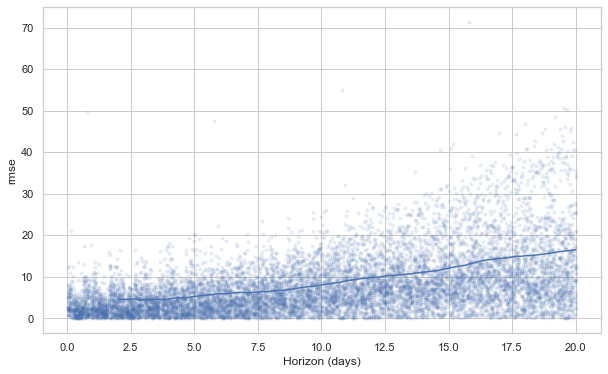

In [50]:
from prophet.plot import plot_cross_validation_metric

fig = plot_cross_validation_metric(df_cv, metric='rmse')

### Hyper Parameter Tuning

In [51]:
# Python
import itertools

param_grid = {  
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0], 
    'holidays_prior_scale': [0.01, 0.1, 1.0, 10.0]}

In [52]:
# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]

In [53]:
dictest = all_params[1]

In [54]:
dictest.values()

dict_values([0.001, 0.01, 0.1])

In [55]:
from prophet.diagnostics import cross_validation

# Use cross validation to evaluate all parameters
# By default, the initial training period is set to three times the horizon, and cutoffs are made every half a horizon.

rmses = []  # Store the RMSEs for each params here
d = {}
for params in all_params:
    liskeys = list(params.values())
    key = (liskeys[0],liskeys[1], liskeys[2])
    m = Prophet(**params, yearly_seasonality=True).fit(data)  # Fit model with given params
    data_cv = cross_validation(m, horizon = '30 days', parallel="processes")
    data_p = performance_metrics(data_cv, rolling_window=1)
    rmses.append(data_p['rmse'].values[0])
    d[key] = data_p['rmse'].values[0]

INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80698d4640>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19847.5   9.58151e-07       5013.41           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110         19848   5.46545e-05       5060.28   1.038e-08       0.001      234  LS failed, Hessian reset 
     168       19848.4   3.38697e-06        5349.2   7.225e-10       0.001      344  LS failed, Hessian reset 
     185       19848.4   7.70746e-09       4614.93      0.2082      0.2082      368   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         18572   0.000516646       5202.23      0.5712      0.5712      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       17857.1   0.000359497       4564.35    7.21e-08       0.001      159  LS failed, Hessian reset 
      99         17858   2.02297e-06       3988.45       0.348       0.348      182   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       18572.8   7.51131e-09       4959.55      0.3724      0.3724      203   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     137       17858.9   8.45175e-05       4809.66   1.746e-08       0.00

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     190       17859.5   8.78311e-07       5000.72    1.85e-10       0.001      379  LS failed, Hessian reset 
     199       17859.5   1.41356e-07       4652.49      0.7292      0.7292      388   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       17859.5   8.71948e-09       4234.83      0.2148      0.2148      393   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f807d947d60>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19847.5   9.58151e-07       5013.41           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110         19848   5.46545e-05       5060.28   1.038e-08       0.001      234  LS failed, Hessian reset 
     168       19848.4   3.38697e-06        5349.2   7.225e-10       0.001      344  LS failed, Hessian reset 
     185       19848.4   7.70746e-09       4614.93      0.2082      0.2082      368   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         18572   0.000516646       5202.23      0.5712      0.5712      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       17857.1   0.000359497       4564.35    7.21e-08       0.001      159  LS failed, Hessian reset 
      99         17858   2.02297e-06       3988.45       0.348       0.348      182   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       18572.8   7.51131e-09       4959.55      0.3724      0.3724      203   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     137       17858.9   8.45175e-05       4809.66   1.746e-08       0.001      272  LS failed, Hessian reset 
     190       17859.5   8.78311e-07       5000.72    1.85e-10       0.001      379  LS failed, Hessian reset 
     199       17859.5   1.41356e-07       4652.49      0.7292      0.7292      388   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       17859.5   8.71948e-09       4234.83      0.2148      0.2148      393   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80698d6100>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19847.5   9.58151e-07       5013.41           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110         19848   5.46545e-05       5060.28   1.038e-08       0.001      234  LS failed, Hessian reset 
     168       19848.4   3.38697e-06        5349.2   7.225e-10       0.001      344  LS failed, Hessian reset 
     185       19848.4   7.70746e-09       4614.93      0.2082      0.2082      368   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         18572   0.000516646       5202.23      0.5712      0.5712      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       17857.1   0.000359497       4564.35    7.21e-08       0.001      159  LS failed, Hessian reset 
      99         17858   2.02297e-06       3988.45       0.348       0.348      182   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       18572.8   7.51131e-09       4959.55      0.3724      0.3724      203   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     137       17858.9   8.45175e-05       4809.66   1.746e-08       0.00

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     190       17859.5   8.78311e-07       5000.72    1.85e-10       0.001      379  LS failed, Hessian reset 
     199       17859.5   1.41356e-07       4652.49      0.7292      0.7292      388   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       17859.5   8.71948e-09       4234.83      0.2148      0.2148      393   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80891c37c0>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19847.5   9.58151e-07       5013.41           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110         19848   5.46545e-05       5060.28   1.038e-08       0.001      234  LS failed, Hessian reset 
     168       19848.4   3.38697e-06        5349.2   7.225e-10       0.001      344  LS failed, Hessian reset 
     185       19848.4   7.70746e-09       4614.93      0.2082      0.2082      368   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         18572   0.000516646       5202.23      0.5712      0.5712      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       17857.1   0.000359497       4564.35    7.21e-08       0.001      159  LS failed, Hessian reset 
      99         17858   2.02297e-06       3988.45       0.348       0.348      182   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       18572.8   7.51131e-09       4959.55      0.3724      0.3724      203   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     137       17858.9   8.45175e-05       4809.66   1.746e-08       0.00

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     190       17859.5   8.78311e-07       5000.72    1.85e-10       0.001      379  LS failed, Hessian reset 
     199       17859.5   1.41356e-07       4652.49      0.7292      0.7292      388   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       17859.5   8.71948e-09       4234.83      0.2148      0.2148      393   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f807c16aee0>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19961.6   1.03776e-05       4640.29           1           1      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     159       19962.5   0.000210178       5046.16   4.154e-08       0.001      251  LS failed, Hessian reset 
     198       19963.1   1.15746e-08       5064.04      0.3452           1      301   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17969.5    3.6462e-06       4535.55      0.9092      0.9092      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18686.7   4.39928e-05       4967.91           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       17970.3   0.000175942       4575.81    3.28e-08       0.001      195  LS failed, Hessian reset 
     181       18691.9   7.96593e-09       5124.86      0.5389      0.5389      226   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     180       17973.2   0.000113754       5207.06   2.184e-08       0.001      308  LS failed, Hessian reset 
     199       17974.1   1.22028e-06       4620.48      0.4658      0.4658      331   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     223       17974.1    1.5812e-06       5075.87   3.181e-10       0.001      399  LS failed, Hessian reset 
     239       17974.1   8.04403e-09       4808.46      0.5398      0.5398      419   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80698d6760>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19961.6   1.03776e-05       4640.29           1           1      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     159       19962.5   0.000210178       5046.16   4.154e-08       0.001      251  LS failed, Hessian reset 
     198       19963.1   1.15746e-08       5064.04      0.3452           1      301   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -165.016
Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17969.5    3.6462e-06       4535.55      0.9092      0.9092      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18686.7   4.39928e-05       4967.91           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       17970.3   0.000175942       4575.81    3.28e-08       0.001      195  LS failed, Hessian reset 
     181       18691.9   7.96593e-09       5124.86      0.5389      0.5389      226   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance
     180       17973.2   0.000113754       5207.06   2.184e-08       0.00

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       17974.1   1.22028e-06       4620.48      0.4658      0.4658      331   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     223       17974.1    1.5812e-06       5075.87   3.181e-10       0.001      399  LS failed, Hessian reset 
     239       17974.1   8.04403e-09       4808.46      0.5398      0.5398      419   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f807bc01ca0>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19961.6   1.03776e-05       4640.29           1           1      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     159       19962.5   0.000210178       5046.16   4.154e-08       0.001      251  LS failed, Hessian reset 
     198       19963.1   1.15746e-08       5064.04      0.3452           1      301   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -165.016
Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17969.5    3.6462e-06       4535.55      0.9092      0.9092      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18686.7   4.39928e-05       4967.91           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       17970.3   0.000175942       4575.81    3.28e-08       0.001      195  LS failed, Hessian reset 
     181       18691.9   7.96593e-09       5124.86      0.5389      0.5389      226   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     180       17973.2   0.000113754       5207.06   2.184e-08       0.001      308  LS failed, Hessian reset 
     199       17974.1   1.22028e-06       4620.48      0.4658      0.4658      331   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     223       17974.1    1.5812e-06       5075.87   3.181e-10       0.001      399  LS failed, Hessian reset 
     239       17974.1   8.04403e-09       4808.46      0.5398      0.5398      419   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f807da36040>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19961.6   1.03776e-05       4640.29           1           1      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     159       19962.5   0.000210178       5046.16   4.154e-08       0.001      251  LS failed, Hessian reset 
     198       19963.1   1.15746e-08       5064.04      0.3452           1      301   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17969.5    3.6462e-06       4535.55      0.9092      0.9092      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18686.7   4.39928e-05       4967.91           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       17970.3   0.000175942       4575.81    3.28e-08       0.001      195  LS failed, Hessian reset 
     181       18691.9   7.96593e-09       5124.86      0.5389      0.5389      226   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     180       17973.2   0.000113754       5207.06   2.184e-08       0.001      308  LS failed, Hessian reset 
     199       17974.1   1.22028e-06       4620.48      0.4658      0.4658      331   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     223       17974.1    1.5812e-06       5075.87   3.181e-10       0.001      399  LS failed, Hessian reset 
     239       17974.1   8.04403e-09       4808.46      0.5398      0.5398      419   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80698d4040>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19963.6   3.81832e-08       4940.45           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       19963.6   9.09458e-09       5024.49      0.5757      0.5757      135   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17970.9   2.09171e-07       4306.95      0.9194      0.9194      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18688.6   1.05344e-05       4341.35      0.5515      0.5515      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       18688.7   1.46068e-08       4549.42      0.2837           1      177   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     111       17970.9   3.09565e-06       4484.01   6.528e-10       0.001      190  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     134       17970.9   7.07778e-09       4585.95      0.4841      0.4841      220   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80812b3d60>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19963.6   3.81832e-08       4940.45           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       19963.6   9.09458e-09       5024.49      0.5757      0.5757      135   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17970.9   2.09171e-07       4306.95      0.9194      0.9194      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18688.6   1.05344e-05       4341.35      0.5515      0.5515      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       18688.7   1.46068e-08       4549.42      0.2837           1      177   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     111       17970.9   3.09565e-06       4484.01   6.528e-10       0.001      190  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     134       17970.9   7.07778e-09       4585.95      0.4841      0.4841      220   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80812c2a00>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19963.6   3.81832e-08       4940.45           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       19963.6   9.09458e-09       5024.49      0.5757      0.5757      135   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17970.9   2.09171e-07       4306.95      0.9194      0.9194      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18688.6   1.05344e-05       4341.35      0.5515      0.5515      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       18688.7   1.46068e-08       4549.42      0.2837           1      177   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     111       17970.9   3.09565e-06       4484.01   6.528e-10       0.001      190  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     134       17970.9   7.07778e-09       4585.95      0.4841      0.4841      220   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80698d8b20>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19963.6   3.81832e-08       4940.45           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101       19963.6   9.09458e-09       5024.49      0.5757      0.5757      135   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17970.9   2.09171e-07       4306.95      0.9194      0.9194      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18688.6   1.05344e-05       4341.35      0.5515      0.5515      135   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       17970.9   3.09565e-06       4484.01   6.528e-10       0.001      190  LS failed, Hessian reset 
     131       18688.7   1.46068e-08       4549.42      0.2837           1      177   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     134       17970.9   7.07778e-09       4585.95      0.4841      0.48

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19964.6   4.95957e-06       5070.86           1           1      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       19964.6   6.92537e-09       4918.07      0.3741      0.3741      168   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      74       17969.1    0.00034991       5318.31    6.25e-08       0.001      138  LS failed, Hessian reset 
      99       18688.6    6.2474e-07       4817.34      0.6517      0.6517      142   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17970.1    2.1493e-06       4479.07           1           1      169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       18688.6   1.95068e-07       4413.31   3.963e-11       0.001      211  LS failed, Hessian reset 
     137       18688.6   5.72236e-09       4168.05       0.223       0.223      225   
Optimization terminated normally: 
  Convergence detected: absolute

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     193       17975.3   6.58249e-06       5339.16   1.332e-09       0.001      365  LS failed, Hessian reset 
     199       17975.3   9.65253e-07       5197.47      0.1023      0.5568      373   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     228       17975.3   7.55493e-09        4904.1      0.6658      0.6658      412   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f807daeb580>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19964.6   4.95957e-06       5070.86           1           1      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       19964.6   6.92537e-09       4918.07      0.3741      0.3741      168   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      74       17969.1    0.00034991       5318.31    6.25e-08       0.001      138  LS failed, Hessian reset 
      99       18688.6    6.2474e-07       4817.34      0.6517      0.6517      142   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17970.1    2.1493e-06       4479.07           1           1      169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       18688.6   1.95068e-07       4413.31   3.963e-11       0.001      211  LS failed, Hessian reset 
     137       18688.6   5.72236e-09       4168.05       0.223       0.223      225   
Optimization terminated normally: 
  Convergence detected: absolute

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     193       17975.3   6.58249e-06       5339.16   1.332e-09       0.001      365  LS failed, Hessian reset 
     199       17975.3   9.65253e-07       5197.47      0.1023      0.5568      373   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     228       17975.3   7.55493e-09        4904.1      0.6658      0.6658      412   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80810baa90>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19964.6   4.95957e-06       5070.86           1           1      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       19964.6   6.92537e-09       4918.07      0.3741      0.3741      168   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      74       17969.1    0.00034991       5318.31    6.25e-08       0.001      138  LS failed, Hessian reset 
      99       18688.6    6.2474e-07       4817.34      0.6517      0.6517      142   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17970.1    2.1493e-06       4479.07           1           1      169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       18688.6   1.95068e-07       4413.31   3.963e-11       0.001      211  LS failed, Hessian reset 
     137       18688.6   5.72236e-09       4168.05       0.223       0.223      225   
Optimization terminated normally: 
  Convergence detected: absolute

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     193       17975.3   6.58249e-06       5339.16   1.332e-09       0.001      365  LS failed, Hessian reset 
     199       17975.3   9.65253e-07       5197.47      0.1023      0.5568      373   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     228       17975.3   7.55493e-09        4904.1      0.6658      0.6658      412   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80812aea00>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19964.6   4.95957e-06       5070.86           1           1      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       19964.6   6.92537e-09       4918.07      0.3741      0.3741      168   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      74       17969.1    0.00034991       5318.31    6.25e-08       0.001      138  LS failed, Hessian reset 
      99       18688.6    6.2474e-07       4817.34      0.6517      0.6517      142   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17970.1    2.1493e-06       4479.07           1           1      169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       18688.6   1.95068e-07       4413.31   3.963e-11       0.001      211  LS failed, Hessian reset 
     137       18688.6   5.72236e-09       4168.05       0.223       0.223      225   
Optimization terminated normally: 
  Convergence detected: absolute

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     193       17975.3   6.58249e-06       5339.16   1.332e-09       0.001      365  LS failed, Hessian reset 
     199       17975.3   9.65253e-07       5197.47      0.1023      0.5568      373   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     228       17975.3   7.55493e-09        4904.1      0.6658      0.6658      412   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f807c16aa00>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19848.8   0.000119534       495.367           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143         19849   9.11552e-08       461.917      0.2311           1      185   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17872.6   5.70666e-05       476.041      0.5568      0.5568      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18577.6   3.45221e-05       480.022      0.3081           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       18577.6   9.46701e-06       392.809   1.891e-08       0.001      186  LS failed, Hessian reset 
     153       17872.8   3.87661e-05       512.077   8.092e-08       0.001      240  LS failed, Hessian reset 
     176       17872.8   6.98289e-08       480.122      0.1156      0.3587      272   
Optimization terminated normally: 
  Convergence detected: relative

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19848.8   0.000119534       495.367           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143         19849   9.11552e-08       461.917      0.2311           1      185   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17872.6   5.70666e-05       476.041      0.5568      0.5568      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18577.6   3.45221e-05       480.022      0.3081           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       18577.6   9.46701e-06       392.809   1.891e-08       0.001      186  LS failed, Hessian reset 
     153       17872.8   3.87661e-05       512.077   8.092e-08       0.001      240  LS failed, Hessian reset 
     176       17872.8   6.98289e-08       480.122      0.1156      0.3587      272   
Optimization terminated normally: 
  Convergence detected: relative

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19848.8   0.000119534       495.367           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143         19849   9.11552e-08       461.917      0.2311           1      185   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17872.6   5.70666e-05       476.041      0.5568      0.5568      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18577.6   3.45221e-05       480.022      0.3081           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       18577.6   9.46701e-06       392.809   1.891e-08       0.001      186  LS failed, Hessian reset 
     153       17872.8   3.87661e-05       512.077   8.092e-08       0.001      240  LS failed, Hessian reset 
     176       17872.8   6.98289e-08       480.122      0.1156      0.3587      272   
Optimization terminated normally: 
  Convergence detected: relative

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19848.8   0.000119534       495.367           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143         19849   9.11552e-08       461.917      0.2311           1      185   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17872.6   5.70666e-05       476.041      0.5568      0.5568      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18577.6   3.45221e-05       480.022      0.3081           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     103       18577.6   9.46701e-06       392.809   1.891e-08       0.001      186  LS failed, Hessian reset 
     153       17872.8   3.87661e-05       512.077   8.092e-08       0.001      240  LS failed, Hessian reset 
     176       17872.8   6.98289e-08       480.122      0.1156      0.3587      272   
Optimization terminated normally: 
  Convergence detected: relative

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19963.2      0.001634       726.416      0.2037           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136       19963.9   0.000198367       554.369   3.777e-07       0.001      213  LS failed, Hessian reset 
     193         19964   4.24294e-06       478.368   7.906e-09       0.001      326  LS failed, Hessian reset 
     199         19964   6.15172e-07       427.743      0.2692           1      333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209         19964   1.80197e-07       472.601      0.5176      0.5176      346   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18692.4   8.04933e-06       461.693           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17986.8   0.000865197       491.634           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101         17987   0.000251271       618.594   3.588e-07       0.001      186  LS failed, Hessian reset 
     132       18692.4   9.12432e-05       496.912   1.505e-07       0.001      212  LS failed, Hessian reset 
     168       18692.5   6.34983e-08       510.726      0.4767      0.4767      257   
Optimization terminated normally: 
  Convergence detected: relative

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19963.2      0.001634       726.416      0.2037           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136       19963.9   0.000198367       554.369   3.777e-07       0.001      213  LS failed, Hessian reset 
     193         19964   4.24294e-06       478.368   7.906e-09       0.001      326  LS failed, Hessian reset 
     199         19964   6.15172e-07       427.743      0.2692           1      333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209         19964   1.80197e-07       472.601      0.5176      0.5176      346   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -165.016
Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17986.8   0.000865197       491.634           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18692.4   8.04933e-06       461.693           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101         17987   0.000251271       618.594   3.588e-07       0.001      186  LS failed, Hessian reset 
     132       18692.4   9.12432e-05       496.912   1.505e-07       0.001      212  LS failed, Hessian reset 
     164       17987.2   3.96037e-08       499.147      0.2426      0.2426      267   
Optimization terminated normally: 
  Convergence detected: relative

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19963.2      0.001634       726.416      0.2037           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136       19963.9   0.000198367       554.369   3.777e-07       0.001      213  LS failed, Hessian reset 
     193         19964   4.24294e-06       478.368   7.906e-09       0.001      326  LS failed, Hessian reset 
     199         19964   6.15172e-07       427.743      0.2692           1      333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209         19964   1.80197e-07       472.601      0.5176      0.5176      346   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17986.8   0.000865197       491.634           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18692.4   8.04933e-06       461.693           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101         17987   0.000251271       618.594   3.588e-07       0.001      186  LS failed, Hessian reset 
     132       18692.4   9.12432e-05       496.912   1.505e-07       0.001      212  LS failed, Hessian reset 
     164       17987.2   3.96037e-08       499.147      0.2426      0.2426      267   
Optimization terminated normally: 
  Convergence detected: relative

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19963.2      0.001634       726.416      0.2037           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136       19963.9   0.000198367       554.369   3.777e-07       0.001      213  LS failed, Hessian reset 
     193         19964   4.24294e-06       478.368   7.906e-09       0.001      326  LS failed, Hessian reset 
     199         19964   6.15172e-07       427.743      0.2692           1      333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209         19964   1.80197e-07       472.601      0.5176      0.5176      346   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17986.8   0.000865197       491.634           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18692.4   8.04933e-06       461.693           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     101         17987   0.000251271       618.594   3.588e-07       0.001      186  LS failed, Hessian reset 
     132       18692.4   9.12432e-05       496.912   1.505e-07       0.001      212  LS failed, Hessian reset 
     164       17987.2   3.96037e-08       499.147      0.2426      0.2426      267   
Optimization terminated normally: 
  Convergence detected: relative

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         19963    0.00194182       500.489           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     167       19965.1   1.92227e-07       514.945      0.5646      0.5646      218   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         17988   0.000224317       445.727           1           1      141   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18693.6   4.25426e-05       492.451      0.4434      0.8182      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       17988.2   0.000199633       530.804    3.61e-07       0.001      201  LS failed, Hessian reset 
     140       18693.7   6.23712e-06       512.481   1.248e-08       0.001      236  LS failed, Hessian reset 
     166       18693.7   8.28417e-08        503.62      0.1487      0.4262      272   
Optimization terminated normally: 
  Convergence detected: relative

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     163       17988.4   0.000137618       521.666   2.447e-07       0.001      318  LS failed, Hessian reset 
     194       17988.5   2.38417e-07       487.527       0.621       0.621      357   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80698dad60>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         19963    0.00194182       500.489           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     167       19965.1   1.92227e-07       514.945      0.5646      0.5646      218   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -165.016
Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18693.6   4.25426e-05       492.451      0.4434      0.8182      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         17988   0.000224317       445.727           1           1      141   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       17988.2   0.000199633       530.804    3.61e-07       0.001      201  LS failed, Hessian reset 
     140       18693.7   6.23712e-06       512.481   1.248e-08       0.001      236  LS failed, Hessian reset 
     166       18693.7   8.28417e-08        503.62      0.1487      0.4262      272   
Optimization terminated normally: 
  Convergence detected: relative

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     194       17988.5   2.38417e-07       487.527       0.621       0.621      357   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80890670d0>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         19963    0.00194182       500.489           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     167       19965.1   1.92227e-07       514.945      0.5646      0.5646      218   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         17988   0.000224317       445.727           1           1      141   
      99       18693.6   4.25426e-05       492.451      0.4434      0.8182      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       17988.2   0.000199633       530.804    3.61e-07       0.001      201  LS failed, Hessian reset 
     140       18693.7   6.23712e-06       512.481   1.248e-08       0.001      236  LS failed, Hessian reset 
     166       18693.7   8.28417e-08        503.62      0.1487      0.4262      272   
Optimization terminated normally: 
  Convergence detected: relative

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     163       17988.4   0.000137618       521.666   2.447e-07       0.001      318  LS failed, Hessian reset 
     194       17988.5   2.38417e-07       487.527       0.621       0.621      357   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80812b1ca0>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         19963    0.00194182       500.489           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     167       19965.1   1.92227e-07       514.945      0.5646      0.5646      218   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18693.6   4.25426e-05       492.451      0.4434      0.8182      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         17988   0.000224317       445.727           1           1      141   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       17988.2   0.000199633       530.804    3.61e-07       0.001      201  LS failed, Hessian reset 
     140       18693.7   6.23712e-06       512.481   1.248e-08       0.001      236  LS failed, Hessian reset 
     166       18693.7   8.28417e-08        503.62      0.1487      0.4262      272   
Optimization terminated normally: 
  Convergence detected: relative

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     194       17988.5   2.38417e-07       487.527       0.621       0.621      357   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80698d6100>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       19961.6    0.00137415       585.019   2.029e-06       0.001      165  LS failed, Hessian reset 
      99       19962.1    0.00054369       421.129           1           1      177   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142       19964.6   0.000417582       585.424   8.309e-07       0.001      264  LS failed, Hessian reset 
     173         19965   4.23539e-05       492.183   8.388e-08       0.001      332  LS failed, Hessian reset 
     199       19965.1   4.70005e-07       492.952           1           1      370   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       19965.1   7.56631e-08       496.616      0.2991           1      376   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         17988   7.99467e-05       499.952      0.3969           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18693.7   6.27294e-06       481.541      0.4917      0.4917      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       18693.7    1.2231e-07       477.711      0.2563           1      155   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     136       17988.3   0.000215822       418.873   4.353e-07       0.001      223  LS failed, Hessian reset 
     190       17988.5   1.35816e-07       500.568           1           1      291   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f807c15b460>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       19961.6    0.00137415       585.019   2.029e-06       0.001      165  LS failed, Hessian reset 
      99       19962.1    0.00054369       421.129           1           1      177   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142       19964.6   0.000417582       585.424   8.309e-07       0.001      264  LS failed, Hessian reset 
     173         19965   4.23539e-05       492.183   8.388e-08       0.001      332  LS failed, Hessian reset 
     199       19965.1   4.70005e-07       492.952           1           1      370   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       19965.1   7.56631e-08       496.616      0.2991           1      376   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18693.7   6.27294e-06       481.541      0.4917      0.4917      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         17988   7.99467e-05       499.952      0.3969           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       18693.7    1.2231e-07       477.711      0.2563           1      155   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     136       17988.3   0.000215822       418.873   4.353e-07       0.001      223  LS failed, Hessian reset 
     190       17988.5   1.35816e-07       500.568           1           1      291   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80698dab20>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       19961.6    0.00137415       585.019   2.029e-06       0.001      165  LS failed, Hessian reset 
      99       19962.1    0.00054369       421.129           1           1      177   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142       19964.6   0.000417582       585.424   8.309e-07       0.001      264  LS failed, Hessian reset 
     173         19965   4.23539e-05       492.183   8.388e-08       0.001      332  LS failed, Hessian reset 
     199       19965.1   4.70005e-07       492.952           1           1      370   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       19965.1   7.56631e-08       496.616      0.2991           1      376   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         17988   7.99467e-05       499.952      0.3969           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18693.7   6.27294e-06       481.541      0.4917      0.4917      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       18693.7    1.2231e-07       477.711      0.2563           1      155   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     136       17988.3   0.000215822       418.873   4.353e-07       0.001      223  LS failed, Hessian reset 
     190       17988.5   1.35816e-07       500.568           1           1      291   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80812b2580>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       19961.6    0.00137415       585.019   2.029e-06       0.001      165  LS failed, Hessian reset 
      99       19962.1    0.00054369       421.129           1           1      177   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142       19964.6   0.000417582       585.424   8.309e-07       0.001      264  LS failed, Hessian reset 
     173         19965   4.23539e-05       492.183   8.388e-08       0.001      332  LS failed, Hessian reset 
     199       19965.1   4.70005e-07       492.952           1           1      370   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     203       19965.1   7.56631e-08       496.616      0.2991           1      376   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         17988   7.99467e-05       499.952      0.3969           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18693.7   6.27294e-06       481.541      0.4917      0.4917      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       18693.7    1.2231e-07       477.711      0.2563           1      155   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     136       17988.3   0.000215822       418.873   4.353e-07       0.001      223  LS failed, Hessian reset 
     190       17988.5   1.35816e-07       500.568           1           1      291   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f807da364c0>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19848.7    0.00021419       53.4355           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       19849.1   0.000100227       45.4064      0.9067      0.9067      251   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       19849.2   2.35044e-06       31.9559      0.9776      0.9776      297   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17873.1   0.000319169       123.783           1           1      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18577.9   0.000460085         128.1           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       18577.9   3.61083e-05       51.4851   2.242e-07       0.001      181  LS failed, Hessian reset 
     158         18578   0.000102542       65.1902   2.121e-06       0.001      284  LS failed, Hessian reset 
     194       17873.5   4.19652e-05       54.4135   2.275e-07       0.001      301  LS failed, Hessian reset 
     199       17873.5    0.00037358       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       17873.6   1.48797e-06       41.9208      0.1677      0.1677      472   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     314       17873.7   0.000139783       176.926   1.962e-06       0.001      543  LS failed, Hessian reset 
     370       17873.8   1.57326e-06        42.928      0.3182           1      617   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f807c15bdc0>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19848.7    0.00021419       53.4355           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       19849.1   0.000100227       45.4064      0.9067      0.9067      251   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       19849.2   2.35044e-06       31.9559      0.9776      0.9776      297   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17873.1   0.000319169       123.783           1           1      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18577.9   0.000460085         128.1           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       18577.9   3.61083e-05       51.4851   2.242e-07       0.001      181  LS failed, Hessian reset 
     158         18578   0.000102542       65.1902   2.121e-06       0.001      284  LS failed, Hessian reset 
     194       17873.5   4.19652e-05       54.4135   2.275e-07       0.001      301  LS failed, Hessian reset 
     199       17873.5    0.00037358       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       17873.6   1.48797e-06       41.9208      0.1677      0.1677      472   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     314       17873.7   0.000139783       176.926   1.962e-06       0.001      543  LS failed, Hessian reset 
     370       17873.8   1.57326e-06        42.928      0.3182           1      617   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80812ac820>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19848.7    0.00021419       53.4355           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       19849.1   0.000100227       45.4064      0.9067      0.9067      251   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       19849.2   2.35044e-06       31.9559      0.9776      0.9776      297   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18577.9   0.000460085         128.1           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17873.1   0.000319169       123.783           1           1      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       18577.9   3.61083e-05       51.4851   2.242e-07       0.001      181  LS failed, Hessian reset 
     158         18578   0.000102542       65.1902   2.121e-06       0.001      284  LS failed, Hessian reset 
     194       17873.5   4.19652e-05       54.4135   2.275e-07       0.001      301  LS failed, Hessian reset 
     199       17873.5    0.00037358       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       17873.6   1.48797e-06       41.9208      0.1677      0.1677      472   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     314       17873.7   0.000139783       176.926   1.962e-06       0.001      543  LS failed, Hessian reset 
     370       17873.8   1.57326e-06        42.928      0.3182           1      617   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80890677f0>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19848.7    0.00021419       53.4355           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       19849.1   0.000100227       45.4064      0.9067      0.9067      251   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       19849.2   2.35044e-06       31.9559      0.9776      0.9776      297   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18577.9   0.000460085         128.1           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17873.1   0.000319169       123.783           1           1      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       18577.9   3.61083e-05       51.4851   2.242e-07       0.001      181  LS failed, Hessian reset 
     158         18578   0.000102542       65.1902   2.121e-06       0.001      284  LS failed, Hessian reset 
     194       17873.5   4.19652e-05       54.4135   2.275e-07       0.001      301  LS failed, Hessian reset 
     199       17873.5    0.00037358       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       17873.6   1.48797e-06       41.9208      0.1677      0.1677      472   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     314       17873.7   0.000139783       176.926   1.962e-06       0.001      543  LS failed, Hessian reset 
     370       17873.8   1.57326e-06        42.928      0.3182           1      617   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80891c37c0>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19963.9    0.00803481       102.582           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       19964.3   0.000101264       30.2439           1           1      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     233       19964.3   4.40135e-05       80.4251   9.426e-07       0.001      333  LS failed, Hessian reset 
     257       19964.3   1.13601e-06        34.872      0.3235      0.3235      361   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17986.6    0.00479091       189.707      0.7902      0.7902      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         18692    0.00215843        175.56           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       18692.2   3.14996e-05       72.8842   3.951e-07       0.001      224  LS failed, Hessian reset 
     199       17987.3   0.000106688        59.272     0.07895           1      261   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       18692.2   0.000259225       59.1916           1           1      287   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     335       18692.4   9.72773e-07       44.2546      0.3055           1      502   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80398d4e50>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19963.9    0.00803481       102.582           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       19964.3   0.000101264       30.2439           1           1      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     233       19964.3   4.40135e-05       80.4251   9.426e-07       0.001      333  LS failed, Hessian reset 
     257       19964.3   1.13601e-06        34.872      0.3235      0.3235      361   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         18692    0.00215843        175.56           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17986.6    0.00479091       189.707      0.7902      0.7902      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       18692.2   3.14996e-05       72.8842   3.951e-07       0.001      224  LS failed, Hessian reset 
     199       17987.3   0.000106688        59.272     0.07895           1      261   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       18692.2   0.000259225       59.1916           1           1      287   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19963.9    0.00803481       102.582           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       19964.3   0.000101264       30.2439           1           1      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     233       19964.3   4.40135e-05       80.4251   9.426e-07       0.001      333  LS failed, Hessian reset 
     257       19964.3   1.13601e-06        34.872      0.3235      0.3235      361   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17986.6    0.00479091       189.707      0.7902      0.7902      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         18692    0.00215843        175.56           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       18692.2   3.14996e-05       72.8842   3.951e-07       0.001      224  LS failed, Hessian reset 
     199       17987.3   0.000106688        59.272     0.07895           1      261   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       18692.2   0.000259225       59.1916           1           1      287   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19963.9    0.00803481       102.582           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       19964.3   0.000101264       30.2439           1           1      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     233       19964.3   4.40135e-05       80.4251   9.426e-07       0.001      333  LS failed, Hessian reset 
     257       19964.3   1.13601e-06        34.872      0.3235      0.3235      361   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17986.6    0.00479091       189.707      0.7902      0.7902      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         18692    0.00215843        175.56           1           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       18692.2   3.14996e-05       72.8842   3.951e-07       0.001      224  LS failed, Hessian reset 
     199       17987.3   0.000106688        59.272     0.07895           1      261   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       18692.2   0.000259225       59.1916           1           1      287   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         19965   0.000290549       67.8439           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       19965.2   0.000267592        134.99   4.263e-06       0.001      226  LS failed, Hessian reset 
     183       19965.5   3.77712e-05         73.41   4.253e-07       0.001      312  LS failed, Hessian reset 
     199       19965.5   8.50114e-05       46.9076           1           1      333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       19965.6   1.42722e-05       37.0217      0.4508           1      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     309       19965.6   5.47296e-05       96.2284   9.668e-07       0.001      523  LS failed, Hessian reset

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      42       18692.6   2.90431e-05       72.5941   5.596e-07       0.001      105  LS failed, Hessian reset 
      99       17987.7    0.00104231       49.9815           1           1      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       18692.9   7.87083e-05       106.754   9.219e-07       0.001      199  LS failed, Hessian reset 
      99         18693    0.00043466       116.028           1           1      211   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       17988.4    3.8644e-05       46.0715       0.233      0.7704      265   
    Iter      log prob        ||dx||      ||grad||       alpha     

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         19965   0.000290549       67.8439           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       19965.2   0.000267592        134.99   4.263e-06       0.001      226  LS failed, Hessian reset 
     183       19965.5   3.77712e-05         73.41   4.253e-07       0.001      312  LS failed, Hessian reset 
     199       19965.5   8.50114e-05       46.9076           1           1      333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       19965.6   1.42722e-05       37.0217      0.4508           1      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     309       19965.6   5.47296e-05       96.2284   9.668e-07       0.001      523  LS failed, Hessian reset

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      42       18692.6   2.90431e-05       72.5941   5.596e-07       0.001      105  LS failed, Hessian reset 
      99       17987.7    0.00104231       49.9815           1           1      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       18692.9   7.87083e-05       106.754   9.219e-07       0.001      199  LS failed, Hessian reset 
      99         18693    0.00043466       116.028           1           1      211   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       17988.4    3.8644e-05       46.0715       0.233      0.7704      265   
    Iter      log prob        ||dx||      ||grad||       alpha     

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         19965   0.000290549       67.8439           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       19965.2   0.000267592        134.99   4.263e-06       0.001      226  LS failed, Hessian reset 
     183       19965.5   3.77712e-05         73.41   4.253e-07       0.001      312  LS failed, Hessian reset 
     199       19965.5   8.50114e-05       46.9076           1           1      333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       19965.6   1.42722e-05       37.0217      0.4508           1      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     309       19965.6   5.47296e-05       96.2284   9.668e-07       0.001      523  LS failed, Hessian reset

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      42       18692.6   2.90431e-05       72.5941   5.596e-07       0.001      105  LS failed, Hessian reset 
      99       17987.7    0.00104231       49.9815           1           1      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       18692.9   7.87083e-05       106.754   9.219e-07       0.001      199  LS failed, Hessian reset 
      99         18693    0.00043466       116.028           1           1      211   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       17988.4    3.8644e-05       46.0715       0.233      0.7704      265   
    Iter      log prob        ||dx||      ||grad||       alpha     

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         19965   0.000290549       67.8439           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     143       19965.2   0.000267592        134.99   4.263e-06       0.001      226  LS failed, Hessian reset 
     183       19965.5   3.77712e-05         73.41   4.253e-07       0.001      312  LS failed, Hessian reset 
     199       19965.5   8.50114e-05       46.9076           1           1      333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       19965.6   1.42722e-05       37.0217      0.4508           1      458   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     309       19965.6   5.47296e-05       96.2284   9.668e-07       0.001      523  LS failed, Hessian reset

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      42       18692.6   2.90431e-05       72.5941   5.596e-07       0.001      105  LS failed, Hessian reset 
      99       17987.7    0.00104231       49.9815           1           1      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      88       18692.9   7.87083e-05       106.754   9.219e-07       0.001      199  LS failed, Hessian reset 
      99         18693    0.00043466       116.028           1           1      211   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       17988.4    3.8644e-05       46.0715       0.233      0.7704      265   
    Iter      log prob        ||dx||      ||grad||       alpha     

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         19965   0.000477327       52.5847           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     148       19965.3   6.39581e-05       118.165   7.895e-07       0.001      241  LS failed, Hessian reset 
     192       19965.5    1.8817e-05       46.4567   3.287e-07       0.001      344  LS failed, Hessian reset 
     199       19965.5   6.74723e-05        80.366      0.3647      0.3647      355   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     247       19965.5   2.80419e-06       28.4775           1           1      419   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17987.7   0.000697541       53.7046           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         18693   0.000427115       67.1231           1           1      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       17988.5   4.15507e-05       51.2535      0.1624      0.4572      260   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       18693.5      9.54e-05        47.088           1           1      252   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     228       179

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     251       18693.5   2.00526e-06       43.3436      0.2671           1      310   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80398d4e50>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         19965   0.000477327       52.5847           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     148       19965.3   6.39581e-05       118.165   7.895e-07       0.001      241  LS failed, Hessian reset 
     192       19965.5    1.8817e-05       46.4567   3.287e-07       0.001      344  LS failed, Hessian reset 
     199       19965.5   6.74723e-05        80.366      0.3647      0.3647      355   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     247       19965.5   2.80419e-06       28.4775           1           1      419   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17987.7   0.000697541       53.7046           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         18693   0.000427115       67.1231           1           1      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       17988.5   4.15507e-05       51.2535      0.1624      0.4572      260   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       18693.5      9.54e-05        47.088           1           1      252   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     228       179

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     251       18693.5   2.00526e-06       43.3436      0.2671           1      310   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80698ca6a0>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         19965   0.000477327       52.5847           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     148       19965.3   6.39581e-05       118.165   7.895e-07       0.001      241  LS failed, Hessian reset 
     192       19965.5    1.8817e-05       46.4567   3.287e-07       0.001      344  LS failed, Hessian reset 
     199       19965.5   6.74723e-05        80.366      0.3647      0.3647      355   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     247       19965.5   2.80419e-06       28.4775           1           1      419   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17987.7   0.000697541       53.7046           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         18693   0.000427115       67.1231           1           1      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       17988.5   4.15507e-05       51.2535      0.1624      0.4572      260   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       18693.5      9.54e-05        47.088           1           1      252   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     228       179

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     251       18693.5   2.00526e-06       43.3436      0.2671           1      310   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80698db880>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         19965   0.000477327       52.5847           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     148       19965.3   6.39581e-05       118.165   7.895e-07       0.001      241  LS failed, Hessian reset 
     192       19965.5    1.8817e-05       46.4567   3.287e-07       0.001      344  LS failed, Hessian reset 
     199       19965.5   6.74723e-05        80.366      0.3647      0.3647      355   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     247       19965.5   2.80419e-06       28.4775           1           1      419   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17987.7   0.000697541       53.7046           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         18693   0.000427115       67.1231           1           1      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       17988.5   4.15507e-05       51.2535      0.1624      0.4572      260   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       18693.5      9.54e-05        47.088           1           1      252   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     228       179

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     251       18693.5   2.00526e-06       43.3436      0.2671           1      310   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f8079ebfa30>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19854.4   0.000708549       145.358           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       19889.9   0.000599428        121.46      0.2559      0.2559      221   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       19903.3     0.0197428        280.46           1           1      330   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       19912.2    0.00133246       63.4584           1           1      440   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       19913.8    0.00778215       135.472           1           1      546   
    Iter      log prob        ||dx||      ||grad||       alpha   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17896.3     0.0361177       769.838           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18580.7    0.00731675       54.2316           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       17945.5     0.0538315        462.57           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       18588.4      0.530979        886.12       3.369      0.3369      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       179

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       17974.4     0.0696687       138.475           1           1     1149   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       17975.4     0.0311179        295.46       1.983      0.1983     1264   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       17976.2    0.00120358       10.0183       3.385      0.3385     1380   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1223       17976.2   4.18507e-05       44.2173   1.721e-06       0.001     1469  LS failed, Hessian reset 
    1259       17976.3   1.61247e-05       18.1052    1.53e-06       0.001     1550  LS failed, Hessian reset 
    1276       17976.3   3.31297e-06       6.46372   2.529e-07       0.001     1619  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80698d1640>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19854.4   0.000708549       145.358           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       19889.9   0.000599428        121.46      0.2559      0.2559      221   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       19903.3     0.0197428        280.46           1           1      330   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       19912.2    0.00133246       63.4584           1           1      440   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       19913.8    0.00778215       135.472           1           1      546   
    Iter      log prob        ||dx||      ||grad||       alpha   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17896.3     0.0361177       769.838           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18580.7    0.00731675       54.2316           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       17945.5     0.0538315        462.57           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       18588.4      0.530979        886.12       3.369      0.3369      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       179

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       17974.4     0.0696687       138.475           1           1     1149   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       17975.4     0.0311179        295.46       1.983      0.1983     1264   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       17976.2    0.00120358       10.0183       3.385      0.3385     1380   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1223       17976.2   4.18507e-05       44.2173   1.721e-06       0.001     1469  LS failed, Hessian reset 
    1259       17976.3   1.61247e-05       18.1052    1.53e-06       0.001     1550  LS failed, Hessian reset 
    1276       17976.3   3.31297e-06       6.46372   2.529e-07       0.001     1619  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f806a34fca0>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19854.4   0.000708549       145.358           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       19889.9   0.000599428        121.46      0.2559      0.2559      221   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       19903.3     0.0197428        280.46           1           1      330   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       19912.2    0.00133246       63.4584           1           1      440   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       19913.8    0.00778215       135.472           1           1      546   
    Iter      log prob        ||dx||      ||grad||       alpha   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17896.3     0.0361177       769.838           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18580.7    0.00731675       54.2316           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       17945.5     0.0538315        462.57           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       18588.4      0.530979        886.12       3.369      0.3369      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       179

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       17974.4     0.0696687       138.475           1           1     1149   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       17975.4     0.0311179        295.46       1.983      0.1983     1264   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       17976.2    0.00120358       10.0183       3.385      0.3385     1380   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1223       17976.2   4.18507e-05       44.2173   1.721e-06       0.001     1469  LS failed, Hessian reset 
    1259       17976.3   1.61247e-05       18.1052    1.53e-06       0.001     1550  LS failed, Hessian reset 
    1276       17976.3   3.31297e-06       6.46372   2.529e-07       0.001     1619  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80812b3d00>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19854.4   0.000708549       145.358           1           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       19889.9   0.000599428        121.46      0.2559      0.2559      221   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       19903.3     0.0197428        280.46           1           1      330   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       19912.2    0.00133246       63.4584           1           1      440   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       19913.8    0.00778215       135.472           1           1      546   
    Iter      log prob        ||dx||      ||grad||       alpha   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       17896.3     0.0361177       769.838           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18580.7    0.00731675       54.2316           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       17945.5     0.0538315        462.57           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       18588.4      0.530979        886.12       3.369      0.3369      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       179

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     999       17974.4     0.0696687       138.475           1           1     1149   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099       17975.4     0.0311179        295.46       1.983      0.1983     1264   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1199       17976.2    0.00120358       10.0183       3.385      0.3385     1380   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1223       17976.2   4.18507e-05       44.2173   1.721e-06       0.001     1469  LS failed, Hessian reset 
    1259       17976.3   1.61247e-05       18.1052    1.53e-06       0.001     1550  LS failed, Hessian reset 
    1276       17976.3   3.31297e-06       6.46372   2.529e-07       0.001     1619  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f807da364c0>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19979.5      0.308835       2190.46           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       20004.7      0.017368       407.929           1           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       20033.8    0.00638688       148.875      0.6048      0.6048      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       20043.1   0.000292878       8.78643      0.8956      0.8956      447   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       20052.6     0.0629013       196.229      0.5144           1      562   
    Iter      log prob        ||dx||      ||grad||       alpha   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -165.016
Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18066.8      0.982432       983.363           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18704.7    0.00967076       216.734      0.3685      0.3685      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       18067.3   6.13285e-05       25.3629   1.409e-06       0.001      203  LS failed, Hessian reset 
     152       18707.7   4.80758e-05       81.1506   1.117e-06       0.001      243  LS failed, Hessian reset 
     180       18078.6    9.9056e-06       21.8437   3.415e-07       0.001      323  LS failed, Hessian reset 
     184       18708.3   7.20075e-06       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     302       18085.9   5.23463e-06       8.30765   2.301e-07       0.001      565  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80812ae3a0>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19979.5      0.308835       2190.46           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       20004.7      0.017368       407.929           1           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       20033.8    0.00638688       148.875      0.6048      0.6048      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       20043.1   0.000292878       8.78643      0.8956      0.8956      447   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       20052.6     0.0629013       196.229      0.5144           1      562   
    Iter      log prob        ||dx||      ||grad||       alpha   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -165.016
Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18066.8      0.982432       983.363           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18704.7    0.00967076       216.734      0.3685      0.3685      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       18067.3   6.13285e-05       25.3629   1.409e-06       0.001      203  LS failed, Hessian reset 
     152       18707.7   4.80758e-05       81.1506   1.117e-06       0.001      243  LS failed, Hessian reset 
     180       18078.6    9.9056e-06       21.8437   3.415e-07       0.001      323  LS failed, Hessian reset 
     184       18708.3   7.20075e-06       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     302       18085.9   5.23463e-06       8.30765   2.301e-07       0.001      565  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80698d1940>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19979.5      0.308835       2190.46           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       20004.7      0.017368       407.929           1           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       20033.8    0.00638688       148.875      0.6048      0.6048      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       20043.1   0.000292878       8.78643      0.8956      0.8956      447   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       20052.6     0.0629013       196.229      0.5144           1      562   
    Iter      log prob        ||dx||      ||grad||       alpha   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18066.8      0.982432       983.363           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18704.7    0.00967076       216.734      0.3685      0.3685      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       18067.3   6.13285e-05       25.3629   1.409e-06       0.001      203  LS failed, Hessian reset 
     152       18707.7   4.80758e-05       81.1506   1.117e-06       0.001      243  LS failed, Hessian reset 
     180       18078.6    9.9056e-06       21.8437   3.415e-07       0.001      323  LS failed, Hessian reset 
     184       18708.3   7.20075e-06       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     302       18085.9   5.23463e-06       8.30765   2.301e-07       0.001      565  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80698db160>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       19979.5      0.308835       2190.46           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       20004.7      0.017368       407.929           1           1      231   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       20033.8    0.00638688       148.875      0.6048      0.6048      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       20043.1   0.000292878       8.78643      0.8956      0.8956      447   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       20052.6     0.0629013       196.229      0.5144           1      562   
    Iter      log prob        ||dx||      ||grad||       alpha   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -165.016
Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18704.7    0.00967076       216.734      0.3685      0.3685      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18066.8      0.982432       983.363           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       18067.3   6.13285e-05       25.3629   1.409e-06       0.001      203  LS failed, Hessian reset 
     152       18707.7   4.80758e-05       81.1506   1.117e-06       0.001      243  LS failed, Hessian reset 
     180       18078.6    9.9056e-06       21.8437   3.415e-07       0.001      323  LS failed, Hessian reset 
     184       18708.3   7.20075e-06       

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     302       18085.9   5.23463e-06       8.30765   2.301e-07       0.001      565  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80698d8520>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       20001.3       0.18168       722.594           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       20016.3     0.0182746       348.663           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       20043.5     0.0216491       259.544           1           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       20047.2     0.0124675        54.905           1           1      463   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         20049     0.0101039       64.3963           1           1      577   
    Iter      log prob        ||dx||      ||grad||       alpha   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18041.5     0.0831801       99.3649           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18708.2    0.00154072        18.728      0.2399           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       18072.1   0.000777161       43.6626      0.1815     0.01815      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         18711    0.00216532       28.4547           1           1      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     283       180

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       18085.2     0.0705025       539.978      0.4418           1      496   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     464         18087   1.57972e-05       31.2626   2.955e-07       0.001      623  LS failed, Hessian reset 
     499       18087.4   0.000864691       25.6352           1           1      664   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     519       18087.4   5.60759e-06       11.4159   2.753e-07       0.001      738  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80698d1880>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       20001.3       0.18168       722.594           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       20016.3     0.0182746       348.663           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       20043.5     0.0216491       259.544           1           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       20047.2     0.0124675        54.905           1           1      463   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         20049     0.0101039       64.3963           1           1      577   
    Iter      log prob        ||dx||      ||grad||       alpha   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18041.5     0.0831801       99.3649           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18708.2    0.00154072        18.728      0.2399           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       18072.1   0.000777161       43.6626      0.1815     0.01815      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         18711    0.00216532       28.4547           1           1      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     283       180

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       18085.2     0.0705025       539.978      0.4418           1      496   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     464         18087   1.57972e-05       31.2626   2.955e-07       0.001      623  LS failed, Hessian reset 
     499       18087.4   0.000864691       25.6352           1           1      664   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     519       18087.4   5.60759e-06       11.4159   2.753e-07       0.001      738  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80812b5100>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       20001.3       0.18168       722.594           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       20016.3     0.0182746       348.663           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       20043.5     0.0216491       259.544           1           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       20047.2     0.0124675        54.905           1           1      463   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         20049     0.0101039       64.3963           1           1      577   
    Iter      log prob        ||dx||      ||grad||       alpha   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18041.5     0.0831801       99.3649           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18708.2    0.00154072        18.728      0.2399           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       18072.1   0.000777161       43.6626      0.1815     0.01815      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         18711    0.00216532       28.4547           1           1      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     283       180

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       18085.2     0.0705025       539.978      0.4418           1      496   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     464         18087   1.57972e-05       31.2626   2.955e-07       0.001      623  LS failed, Hessian reset 
     499       18087.4   0.000864691       25.6352           1           1      664   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     519       18087.4   5.60759e-06       11.4159   2.753e-07       0.001      738  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f807c15baf0>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       20001.3       0.18168       722.594           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       20016.3     0.0182746       348.663           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       20043.5     0.0216491       259.544           1           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       20047.2     0.0124675        54.905           1           1      463   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         20049     0.0101039       64.3963           1           1      577   
    Iter      log prob        ||dx||      ||grad||       alpha   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18041.5     0.0831801       99.3649           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       18708.2    0.00154072        18.728      0.2399           1      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       18072.1   0.000777161       43.6626      0.1815     0.01815      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         18711    0.00216532       28.4547           1           1      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     283       180

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     399       18085.2     0.0705025       539.978      0.4418           1      496   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     464         18087   1.57972e-05       31.2626   2.955e-07       0.001      623  LS failed, Hessian reset 
     499       18087.4   0.000864691       25.6352           1           1      664   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     519       18087.4   5.60759e-06       11.4159   2.753e-07       0.001      738  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80890677f0>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       20003.6     0.0124378       124.867      0.2763      0.2763      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       20038.7      0.322498       1068.65           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       20043.6     0.0936311       454.375      0.4015           1      345   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       20047.1     0.0610455       113.859           1           1      459   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       20049.8     0.0601409       172.544           1           1      573   
    Iter      log prob        ||dx||      ||grad||       alpha   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      43       18708.1    0.00685261         7.594           1           1       67   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       18041.5      0.118276       478.542           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       18070.1     0.0103825       114.014       0.596       0.596      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       18071.9   0.000320272       51.4345       0.645       0.645      352   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     366       18075.8   3.62363e-05       45.9975   7.444e-07       0.001      473  LS failed, Hessian reset 
     399       18078.9     0.0998426       62.2369           1           1      513   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     407       18078.9   8.56791e-06       18.4083    4.51e-07       0.001      593  LS failed, Hessian reset 
     446       18082.8   2.47176e-05       57.9899   3.254e-07       0.001      685  LS failed, Hessian reset 
     499       18084.7     0.0110254         59.33           1           1      748   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f807da36820>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       20003.6     0.0124378       124.867      0.2763      0.2763      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       20038.7      0.322498       1068.65           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       20043.6     0.0936311       454.375      0.4015           1      345   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       20047.1     0.0610455       113.859           1           1      459   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       20049.8     0.0601409       172.544           1           1      573   
    Iter      log prob        ||dx||      ||grad||       alpha   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      43       18708.1    0.00685261         7.594           1           1       67   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       18041.5      0.118276       478.542           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       18070.1     0.0103825       114.014       0.596       0.596      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       18071.9   0.000320272       51.4345       0.645       0.645      352   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     366       18075.8   3.62363e-05       45.9975   7.444e-07       0.001      473  LS failed, Hessian reset 
     399       18078.9     0.0998426       62.2369           1           1      513   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     407       18078.9   8.56791e-06       18.4083    4.51e-07       0.001      593  LS failed, Hessian reset 
     446       18082.8   2.47176e-05       57.9899   3.254e-07       0.001      685  LS failed, Hessian reset 
     499       18084.7     0.0110254         59.33           1           1      748   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80698d6100>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       20003.6     0.0124378       124.867      0.2763      0.2763      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       20038.7      0.322498       1068.65           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       20043.6     0.0936311       454.375      0.4015           1      345   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       20047.1     0.0610455       113.859           1           1      459   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       20049.8     0.0601409       172.544           1           1      573   
    Iter      log prob        ||dx||      ||grad||       alpha   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      43       18708.1    0.00685261         7.594           1           1       67   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       18041.5      0.118276       478.542           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       18070.1     0.0103825       114.014       0.596       0.596      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       18071.9   0.000320272       51.4345       0.645       0.645      352   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     366       18075.8   3.62363e-05       45.9975   7.444e-07       0.001      473  LS failed, Hessian reset 
     399       18078.9     0.0998426       62.2369           1           1      513   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     407       18078.9   8.56791e-06       18.4083    4.51e-07       0.001      593  LS failed, Hessian reset 
     446       18082.8   2.47176e-05       57.9899   3.254e-07       0.001      685  LS failed, Hessian reset 
     499       18084.7     0.0110254         59.33           1           1      748   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0
INFO:prophet:Making 2 forecasts with cutoffs between 2022-05-19 04:00:00 and 2022-06-03 04:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f80698d13a0>


Initial log joint probability = -195.48
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       20003.6     0.0124378       124.867      0.2763      0.2763      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       20038.7      0.322498       1068.65           1           1      230   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       20043.6     0.0936311       454.375      0.4015           1      345   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       20047.1     0.0610455       113.859           1           1      459   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       20049.8     0.0601409       172.544           1           1      573   
    Iter      log prob        ||dx||      ||grad||       alpha   

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -169.939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -165.016
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      43       18708.1    0.00685261         7.594           1           1       67   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
      99       18041.5      0.118276       478.542           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     199       18070.1     0.0103825       114.014       0.596       0.596      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       18071.9   0.000320272       51.4345       0.645       0.645      352   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     366       18075.8   3.62363e-05       45.9975   7.444e-07       0.001      473  LS failed, Hessian reset 
     399       18078.9     0.0998426       62.2369           1           1      513   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     407       18078.9   8.56791e-06       18.4083    4.51e-07       0.001      593  LS failed, Hessian reset 
     446       18082.8   2.47176e-05       57.9899   3.254e-07       0.001      685  LS failed, Hessian reset 
     499       18084.7     0.0110254         59.33           1           1      748   
    Iter      log prob        ||dx||      |

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
INFO:prophet:Skipping MAPE because y close to 0


In [56]:
# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results
tuning_results['rmse'] = rmses
tuning_results

,changepoint_prior_scale,seasonality_prior_scale,holidays_prior_scale,rmse
0,0.001,0.01,0.01,5.391792
1,0.001,0.01,0.10,5.391792
2,0.001,0.01,1.00,5.391792
3,0.001,0.01,10.00,5.391792
4,0.001,0.10,0.01,5.376015
...,...,...,...,...
59,0.500,1.00,10.00,8.262254
60,0.500,10.00,0.01,8.106540
61,0.500,10.00,0.10,8.106540
62,0.500,10.00,1.00,8.106540


In [57]:
best_params = all_params[np.argmin(rmses)]
print(best_params)

{'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 0.01, 'holidays_prior_scale': 0.01}


### Apply the best parameters to the model

In [58]:
#Aplly model

def fit_model(DATA, COUNTRY):
    m = Prophet(seasonality_mode='multiplicative', changepoint_prior_scale = 0.1,
                seasonality_prior_scale = 0.01,
                holidays_prior_scale = 0.01,
                yearly_seasonality = True, 
                changepoint_range=0.95)

    # GET COUNTRY CODE AND ADD PROPHET HOLIDAYS

    #COUNTRY = 'DENMARK'
    country_info = pycountry.countries.get(name=COUNTRY.replace("_"," ")) or pycountry.countries.get(official_name=COUNTRY.replace("_"," ")) or pycountry.countries.get(alpha_3=COUNTRY)
    m.add_country_holidays(country_name=country_info.alpha_2)

    # ADD REGRESSORS

    for reg in [e for e in list(DATA.columns) if e not in ('ds','y')]:
        m.add_regressor(reg)


    m.fit(DATA)
    return m

In [59]:
m = fit_model(data_train, 'DENMARK')

Initial log joint probability = -83.0395
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       14469.4    0.00643081       261.211           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       14477.1     0.0127726       236.919           1           1      250   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       14479.4     0.0320202       150.315           1           1      382   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     305       14479.8   8.51755e-05       139.098   3.317e-07       0.001      424  LS failed, Hessian reset 
     399       14482.5   0.000994352       64.6265           1           1      544   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     412       14482.8   0.000102985    

In [60]:
forecast = m.predict(data_test)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
2000,2022-07-03 00:00:00,8.190059,2.286667,14.354835
2001,2022-07-03 01:00:00,7.366612,1.204584,13.298631
2002,2022-07-03 02:00:00,6.649852,0.368545,13.057316
2003,2022-07-03 03:00:00,6.054454,0.053547,11.600518
2004,2022-07-03 04:00:00,6.157623,0.035404,12.238712


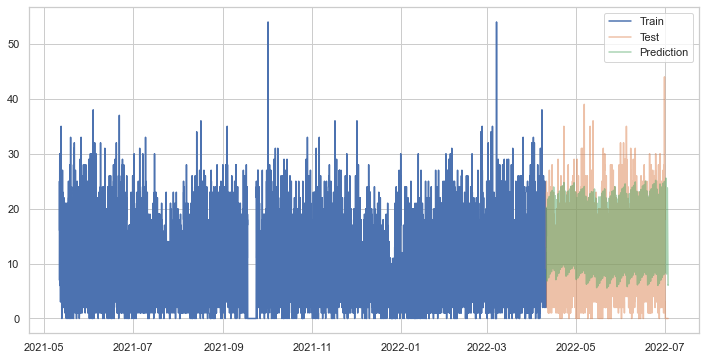

In [61]:
#Plot the train and test data on top the forecast
plt.plot(data_train.set_index('ds')['y'], label='Train')
plt.plot(data_test.set_index('ds')['y'], label='Test',alpha=0.5)
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',alpha=0.5)
plt.legend()

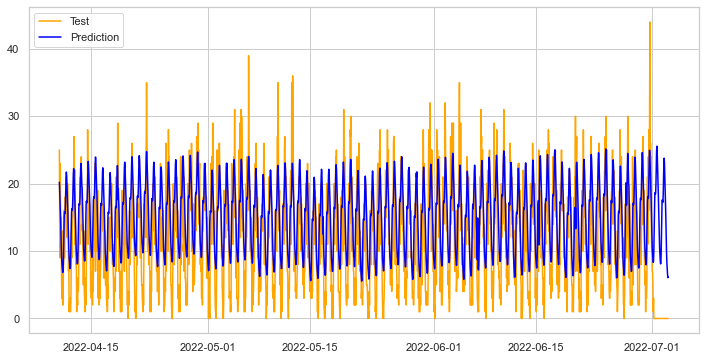

In [62]:
#Plot data test and prediction
fig, ax = plt.subplots()
plt.plot(data_test.set_index('ds')['y'], label='Test',color='orange')
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',color='blue')
plt.legend()

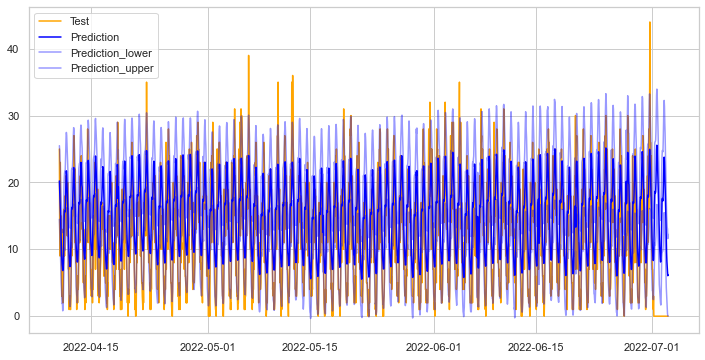

In [63]:
#Plot data test and prediction
fig, ax = plt.subplots()
plt.plot(data_test.set_index('ds')['y'], label='Test',color='orange')
plt.plot(forecast.set_index('ds')['yhat'], label='Prediction',color='blue')
lower=plt.plot(forecast.set_index('ds')['yhat_lower'], label='Prediction_lower',alpha=0.4,color='blue')
upper=plt.plot(forecast.set_index('ds')['yhat_upper'], label='Prediction_upper',alpha=0.4,color='blue')
plt.legend()

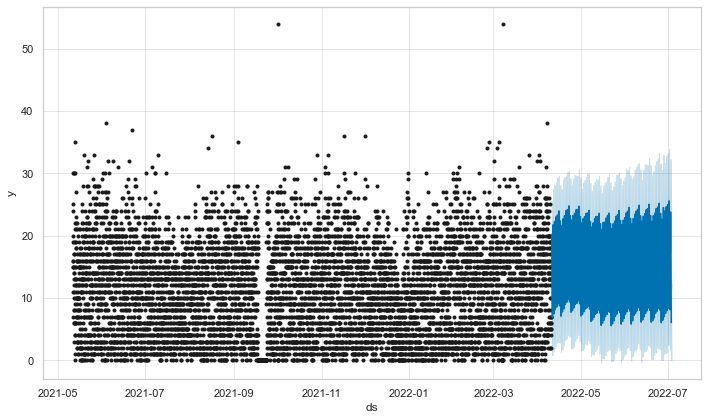

In [64]:
fig1 = m.plot(forecast)

In [65]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m, forecast)

In [66]:
plot_components_plotly(m, forecast)

In [67]:
# Cross validation
#Train on the first 200 days, aply to next 5 days and loop each 5 days to reach final data
from prophet.diagnostics import cross_validation

df_cv = cross_validation(m, initial='200 days', period='5 days', horizon = '20 days', parallel="processes")

INFO:prophet:Making 23 forecasts with cutoffs between 2021-12-01 15:00:00 and 2022-03-21 15:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f807d9e4940>
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_com

Initial log joint probability = -211.829
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -62.2277
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -95.0455
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -90.2288
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -57.4292
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -59.2312
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -57.3274
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -155.652
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99          8708     0.0053245       275.584           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       8462.71    0.00180127       125.688           1           1      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       9204.55    0.00593393       110.559           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       10158.1    0.00577163       381.926      0.8614      0.8614      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       9707.06     0.0120638       176.569      0.3145           1      115   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       9452.89     0.0175294         174.3           1           1      125   
    Iter      log 

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     471       8959.59   6.78155e-05       61.3388   7.325e-07       0.001      658  LS failed, Hessian reset 
     526       8467.07   4.17438e-07       32.0505      0.3126      0.3126      732   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     470       10162.4    1.8321e-06        32.894      0.2438           1      611   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399        9712.8     0.0189638       142.304           1           1      611   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       8959.67   5.02651e-05       45.0634      0.2799           1      690   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     528       8712.01   0.000273684       88.6818   6.264e-06       0.001      739  LS failed, Hessian reset 
     447       9922.75   9.65258e-

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     521       8959.67   6.86326e-07        32.825      0.3244      0.3244      716   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     489       9922.85   1.41589e-06       37.9258      0.3097           1      631   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     582       8712.05      1.31e-05       40.1338   3.802e-07       0.001      848  LS failed, Hessian reset 
     593       8712.05    8.1338e-07       32.7988           1           1      865   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     499       9713.09   5.11918e-05       47.6571      0.5923      0.5923      731   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     561       9713.11   3.59587e-05       35.7634   8.904e-07       0.001      859  LS failed, Hessian reset 
     599       9713.11   4.23446e-06       33.0793      0.3297      0.8395      903   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -59.607
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -70.9513
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -65.689
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -120.061
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -84.5635
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       10401.3    0.00119779       227.379      0.2325           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


      99       10636.6     0.0132368       268.078           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       10870.2    0.00115714        71.811           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -179.005
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -65.4556
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       11109.3   0.000283243       136.074      0.5327      0.5327      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       11333.4    0.00702188       101.405           1           1      117   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       10403.7   0.000457001       59.6882      0.6391      0.6391      259   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       10639.8    0.00119665       117.869           1           1      255   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       10872.9   0.000397728       62.8807           1           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299       11113.1   0.000117376       70.4454       0.597       0.597      366   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -94.0567
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       11751.3    0.00804882       602.542           1           1      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     359       10404.4   8.53233e-05       76.8748   2.324e-06       0.001      489  LS failed, Hessian reset 
     299       11336.9    0.00122579       55.1789           1           1      369   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       10404.4   8.45244e-05       39.6198      0.3361           1      532   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       10641.1   0.000114934    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     425       11338.5   0.000188952        130.95   4.717e-06       0.001      571  LS failed, Hessian reset 
     399       11537.9   0.000569323       59.0867           1           1      496   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     561       10641.6   4.04726e-06       30.4053      0.2401           1      695   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     399       11756.8    0.00262879       62.7706           1           1      495   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       11994.6     0.0023627       163.611      0.3375       0.998      243   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     499       11113.9   1.41058e-05       41.7842           1           1      665   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       10405.1   0.000232472       40.0972           1           1      784   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       11338.5    0.00276584       47.3601           1           1      653   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     523       11113.9   5.51197e-06       34.3079      0.3326           1      696   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     406       11756.9   6.78192e-05       97.4695   5.494e-07       0.001      547  LS failed, Hessian reset 
     627       10405.1   0.000118297       80.0027   2.704e-06       0.001      851  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     492       11538.6   3.19468e-05       43.4722   4.545e-07       0.001      659  LS failed, Hessian reset 
     299       11996.4    0.00122543        63.846      0.5372      0.7788      362   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       11538.6   0.000122485       41.6152           1           1      668   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       10405.2    8.0622e-05       44.4025           1           1      936   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599         11339   0.000141813       40.5941      0.1953           1      777   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     492       11757.6   6.63197e-05        56.576   3.613e-07       0.001      690  LS failed, Hessian reset 
     499       11757.7   0.000138584       67.0614      0.1486

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     593         11539   8.57376e-05       109.823   8.958e-07       0.001      829  LS failed, Hessian reset 
     599         11539   0.000272099       61.3816           1           1      835   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       11339.1   0.000155954       33.1504           1           1      936   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       11757.9    5.6595e-06       40.9618      0.3566           1      824   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     611       11757.9   2.59878e-07       41.1868       0.039           1      841   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     499       11997.6    9.0651e-05       36.6672           1           1      597   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     664         11539   5.99086e-05       51.8976   1.282e-06       0.001      963  LS failed, Hessian reset 
     699         11539   9.76328e-05       31.5269           1           1      999   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     780       11339.3   4.55796e-05       70.1775    8.48e-07       0.001     1101  LS failed, Hessian reset 
     799       11339.3     0.0005694        45.601           1           1     1123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599       11998.3   0.000135559       39.0039           1           1      714   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     717         11539   5.56067e-06       34.9758   1.396e-07

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     699       11998.5   0.000991121       52.6089           1           1      821   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       11539.1   0.000763074        41.692           1           1     1166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       11998.9   0.000194546       49.4613      0.3969           1      942   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     863       11539.2   7.62244e-05       88.0377   1.483e-06       0.001     1293  LS failed, Hessian reset 
     899       11539.3    0.00192478       61.0637      0.8509      0.8509     1333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     890         11999    4.0348e-06       36.1262      0.3069           1     1047   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     971       11539.4   4.22089e-05       42.2674   8.527e-07       0.001     1465  LS failed, Hessian reset 
     985       11539.4   3.52438e-07       31.7987      0.2646      0.2646     1484   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

Initial log joint probability = -71.988
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -268.216
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       12227.6    0.00905547       303.754           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -97.611
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       12467.1    0.00259452       127.655           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       12232.8    0.00184299       138.319           1           1      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       12706.4    0.00198281       121.926           1           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     299         12235    0.00015254       75.8378      0.3089      0.3089      358   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -72.8006
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       12472.5    0.00640688       210.192           1           1      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -181.994
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       12713.3    0.00516602       119.228           1           1      234   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       12474.6    0.00504641       154.325           1           1      364   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       12933.6    0.00640064       270.615           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       12237.3   3.94328e-05       61.3867   4.667e-07       0.001      519  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       12715.5   0.000941835       99.2981           1           1      355   
    Iter      log prob        ||dx||    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -89.4483
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       12475.8   0.000368125       33.4196           1           1      481   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       12939.9    0.00105842       194.054      0.1496           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499         12238    0.00181592        41.327           1           1      638   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199         13101    0.00157021       138.898      0.5958      0.5958      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       12716.1   9.47248e-05       40.2532        1.36        0.33      488   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     599       12238.3    0.00039469       41.7883           1           1      804   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Initial log joint probability = -127.908
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       13103.4    0.00166673       89.5329           1           1      402   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     336       12944.6   4.52886e-05       77.3968   6.054e-07       0.001      461  LS failed, Hessian reset 
     499       12717.5   0.000112192       74.8749      0.6673      0.6673      662   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       13330.3    0.00956406       155.099      0.6957      0.6957      241   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     564       12477.6   3.10382e-05    

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     199       13558.2     0.0224993       94.7411           1           1      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799       12239.7    0.00030428       48.6894           1           1     1099   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       13106.1   0.000364872        46.333       0.303           1      675   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       13334.3   0.000391706       182.342      0.1173           1      489   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699       12718.1    0.00182539       141.793           1           1      933   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     572       12945.9   2.87784e-05       38.5129   3.433e-07       0.001      803  LS failed, Hessian r

/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     799       12718.4   8.67007e-05       38.9662           1           1     1101   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       13334.7   0.000221962       79.2317           1           1      654   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     648       12946.1   4.02185e-05       46.2302   1.098e-06       0.001      940  LS failed, Hessian reset 
     962       12239.8   6.37264e-07       41.1965     0.06215           1     1348   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     672       12946.1   1.48777e-06       38.3812           1           1      972   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     507       13334.7   3.24071e-05       55.8575   4.473e-07       0.001      706  LS failed, Hessian reset 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     387         13565   4.76866e-05       85.4997   4.611e-07       0.001      507  LS failed, Hessian reset 
     399       13565.1    0.00116746       47.3796           1           1      520   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


     554       13334.7   4.90494e-06       43.7112      0.5876      0.5876      761   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
     869       12718.4   7.46362e-06       37.3697   2.326e-07       0.001     1233  LS failed, Hessian reset 
     876       12718.4    4.2844e-07       33.0196      0.2536      0.2536     1242   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

     499       13565.5   0.000255006       35.6808      0.6039      0.6039      634   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     516       13565.5   2.71148e-05       47.4082   4.062e-07       0.001      696  LS failed, Hessian reset 
     573       13565.5   3.38731e-06       28.9259      0.3558           1      769   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/edgartome_1/opt/anaconda3/lib/python3.9/site-packages/prophet/forecaster.py:896: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.con

In [68]:
df_cv.head()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2021-12-01 16:00:00,17.107194,11.008935,23.217354,26,2021-12-01 15:00:00
1,2021-12-01 17:00:00,16.045949,9.861018,21.839839,21,2021-12-01 15:00:00
2,2021-12-01 18:00:00,14.909680,8.688616,20.833935,11,2021-12-01 15:00:00
3,2021-12-01 19:00:00,13.774121,7.612286,19.891631,15,2021-12-01 15:00:00
4,2021-12-01 20:00:00,12.590258,6.634290,18.684831,11,2021-12-01 15:00:00


In [69]:
from prophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p.head()

INFO:prophet:Skipping MAPE because y close to 0


,horizon,mse,rmse,mae,mdape,smape,coverage
0,2 days 00:00:00,25.844662,5.083765,4.043606,0.344249,0.545788,0.752717
1,2 days 01:00:00,25.726897,5.072169,4.050660,0.346817,0.546603,0.750906
2,2 days 02:00:00,25.515939,5.051330,4.024690,0.347752,0.544670,0.753623
3,2 days 03:00:00,25.508648,5.050609,4.008208,0.347252,0.541994,0.754529
4,2 days 04:00:00,25.203004,5.020259,3.988663,0.335598,0.539306,0.755435


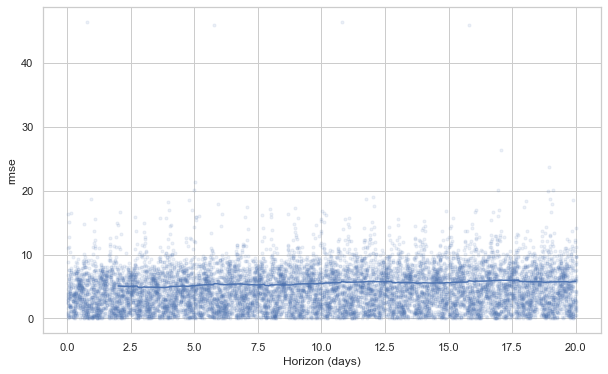

In [70]:
from prophet.plot import plot_cross_validation_metric

fig = plot_cross_validation_metric(df_cv, metric='rmse')

In [71]:
#calculate Root Mean Square  Error(RMSE)
from math import sqrt
from sklearn.metrics import mean_squared_error

rms = sqrt(mean_squared_error(data_test['y'],forecast['yhat']))

print('The root mean square error score for the model is: ', rms)

The root mean square error score for the model is:  5.9621090769510285
